In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
from astropy.io import fits
import astropy.time
import astropy.units as u
from specutils import Spectrum1D
from specutils.manipulation import LinearInterpolatedResampler
from astropy.nddata import StdDevUncertainty
from scipy.optimize import minimize
from scipy.interpolate import griddata
from maskfill import maskfill

import os
from glob import glob
from tqdm import tqdm
import random

from reduce import *

### Functions

In [2]:
def findMatching(imType, imPath):
    '''Find the matching dark/flat/mask/etc for a given image, following
    the Apr 2024 image naming conventions.
    
    `imType` options are: dark, flat, mask, arc, linearity, resetAnom
    '''
    i = imPath.rfind('\\')+1
    path = imPath[:i]
    file = imPath[i:]
    i = file.find('_s')
    name = file[:i]
    seqNum = int(file[i+2:i+4])
    
    if imType=='flat':
        return path+'noWin_masterFlat.fits'
    if imType=='linearity':
        return path+'noWin_linearity.fits'
    if imType=='resetAnom':
        return path+'noWin_resetAnom.fits'
        
    elif imType=='arc':
        pattern = 'masterArc'
    elif imType=='dark':
        pattern = 'masterDark'
    elif imType=='mask':
        pattern = 'pixMask'
    else:
        raise Exception('Image type not recognized')
        
    matches = sorted(glob(path+name+'_s??_'+pattern+'.fits'))
    # Match should have a sequence number lower than the image
    for m in matches[::-1]:
        i = m.find('_s')
        darkNum = int(m[i+2:i+4])
        if darkNum > seqNum:
            continue
        return m
    
    
def makeMasterLinearity(files):
    totalDark = []
    for file in tqdm(files):
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)
        
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.applyRefMap(refMap)
        totalDark.append(dark.data)
        
    totalDark = np.median(totalDark, axis=0)
    p = calcLinearity(totalDark)
    return p


def makeMasterDark(files):
    masterDark = []
    for file in tqdm(files):
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)
        
        dark = Odgw(file, skipReads=1, verbose=False)
        if dark.haveWin and not 'RTIME' in dark.hdr:
            dark.hdr['RTIME'] = 25699 # manual override period
            dark.hdr['FTIME'] = 2599584
        dark.applyRefMap(refMap)
        
        # p = fits.getdata(findMatching('linearity', file))
        # dark.linearize(p)
        
        masterDark.append(dark.data)
        
    masterDark = np.median(masterDark, axis=0)
    return masterDark


def makeMask(seqName, badFreq=0.5, write=True, plot=True):
    '''
    Calculate and save bad pixel map from a sequence of images.
    
    seqName: name and path of sequence files, up to '_s##'
    badFreq: frequency a pixel must be flagged as 'bad' to be saved in the mask
    '''
    files = glob(seqName+'_e*.fits')
    maskSum = None
    
    for file in tqdm(files):

        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)

        dark = Odgw(file, skipReads=1, verbose=False)
        dark.applyRefMap(refMap)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        dark.calcMask2(verbose=False)

        if maskSum is None:
            maskSum = np.isnan(dark.pixMask).astype(int)
        else:
            maskSum += np.isnan(dark.pixMask)


    inds = np.where(maskSum > np.max(maskSum)*badFreq)
    ma = np.ones(maskSum.shape)
    ma[inds] = np.nan
    
    if write: writeFits(ma, seqName+'_pixMask.fits', overwrite=True)

    if plot:
        plt.figure(figsize=(8,1.5))
        plt.imshow(ma, origin='lower', interpolation='none', aspect='auto')

        plt.figure()
        _ = plt.hist(maskSum[maskSum>0], bins=np.arange(np.max(maskSum)+1)+0.5)
        plt.show()
    
    return ma


def getFF(file):
    odgw = Odgw(file, skipReads=1, verbose=False)
    odgw.separateWindow()
    odgw.fitModel(verbose=False)
    refMap = calcRefMap(odgw.residual)
    odgw = Odgw(file, skipReads=1, verbose=False)
    odgw.applyRefMap(refMap)
    odgw.separateWindow()
    return odgw.ff
    

def multiGauss(x, *args):
    n = args[0][0]
    params = args[0][1:]
    y = 0
    for i in range(int(n)):
        mu, sig, a = params[3*i:3*(i+1)]
        y += a*np.exp(-(x-mu)**2/(2*sig**2))

    return y

def arcDist(x, *args):
    spec, n = args
    ind = np.arange(len(spec))
    d = spec - multiGauss(ind, np.append(n,x))
    return np.sum(d**2)

class SpecExtractor:
    '''
    Class assumes same image sizes and wavelength solns for all inputs
    '''
    def __init__(self, flatIm, arcIm, rmin=None, rmax=None, cmin=None, cmax=None):
        self.wvs = None
        self.shape = np.shape(flatIm)
        self.rmin=rmin
        self.rmax=rmax
        self.cmin=cmin
        self.cmax=cmax
        self.setWeights(flatIm)
        self.setArc(arcIm)
    
    def setWeights(self, image):
        w = np.zeros(self.shape[0])
        w[self.rmin:self.rmax] = np.nanmedian(image[self.rmin:self.rmax,self.cmin:self.cmax], axis=1)
        w /= np.sum(w)
        w[w==0] = np.nan
        self.yWeights = w
    
    def setArc(self, image):
        _, spec = self.medExtract(image, self.rmin, self.rmax)
        # _, spec = self.extract(image)
        self.arc = spec
        
    def subContinuum(self, order):
        x = np.arange(len(self.arc))
        poly = np.polyfit(x, self.arc, order)
        self.arc -= np.polyval(poly, x)
        
    def calcWvs(self, arcWvs, guess):
        n = len(arcWvs)
        res = minimize(arcDist, guess, args=(self.arc, n))
        mus = res.x[0:3*n:3]
        
        self.fitSpec = multiGauss(np.arange(len(self.arc)), np.append(n, res.x))
        self.wvs = np.polyval(np.polyfit(mus, arcWvs, 1 if n<4 else 3), np.arange(len(self.arc)))
    
    def extract(self, image):
        weighted = image * self.yWeights[:,None]
        wmean = np.nansum(weighted, axis=0) / np.sum(~np.isnan(weighted), axis=0)
        return self.wvs, wmean
    
    def extractErr(self, image):
        weighted = image**2 * self.yWeights[:,None]
        wmean = np.sqrt(np.nansum(weighted, axis=0)) / np.sum(~np.isnan(weighted), axis=0)
        return self.wvs, wmean
    
    def medExtract(self, image, yMin=None, yMax=None):
        return self.wvs, np.nanmedian(image[yMin:yMax], axis=0)

##### Function testing

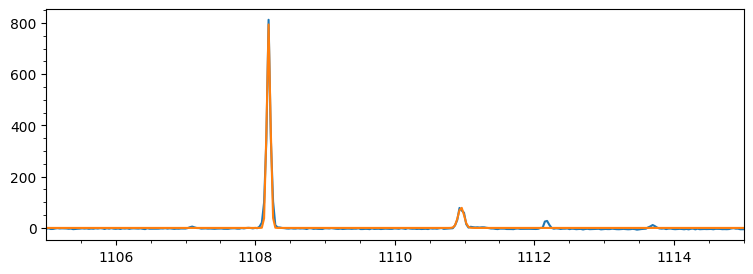

In [63]:
SE = SpecExtractor(fits.getdata('data/2024-04-18/noWin_s04_masterFlat.fits'),
                     fits.getdata('data/2024-04-18/noWin_s04_masterArc.fits'),
                     20, 84, 650, 1470)
plt.figure(figsize=(9,3))
# SE.subContinuum(8)
SE.calcWvs([1108.190, 1110.95], [860,1,500, 945,1,100])
plt.plot(SE.wvs, SE.arc)
plt.plot(SE.wvs, SE.fitSpec)
plt.xlim(1105,1115)
plt.minorticks_on()

### Check for bad images

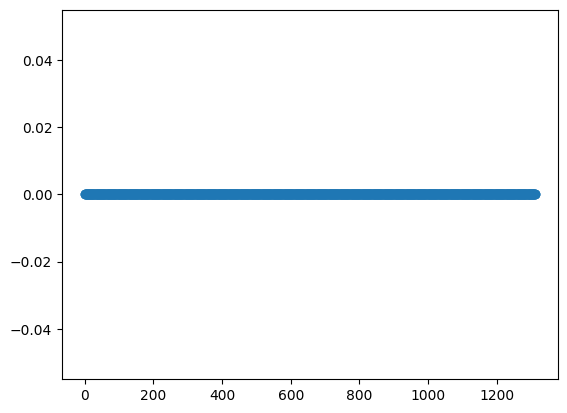

In [ ]:
files = sorted(glob('data/2024-04-1?/*.fits'))
b = []

for f in files:
    if 'BAD' in f: continue
    a = np.sum(fits.getdata(f)[1] == 0)
    b.append(a)
    if a>0: print(f, a)
    

plt.plot(b, 'o')

### Make masters for each sequence

100%|██████████| 20/20 [00:34<00:00,  1.71s/it]


Writing FITS file data/2024-04-17/noWin_initPixMask.fits ...
Writing FITS file data/2024-04-17/noWin_resetAnom.fits ...
Writing FITS file data/2024-04-17/noWin_linearity.fits ...


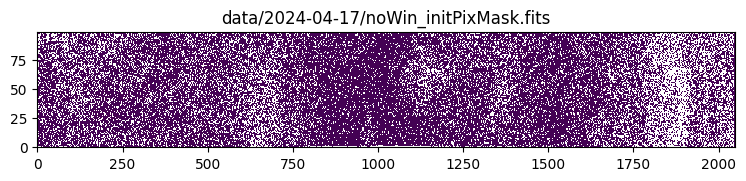

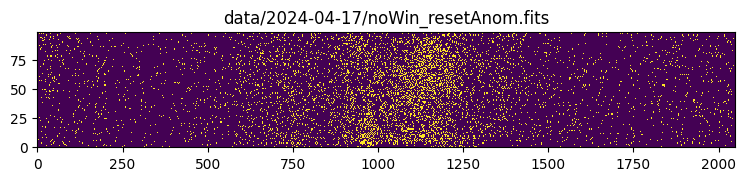

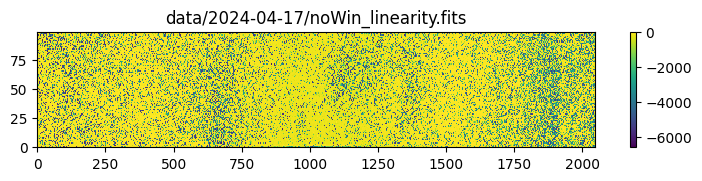

100%|██████████| 40/40 [01:15<00:00,  1.89s/it]


Writing FITS file data/2024-04-18/noWin_initPixMask.fits ...
Writing FITS file data/2024-04-18/noWin_resetAnom.fits ...
Writing FITS file data/2024-04-18/noWin_linearity.fits ...


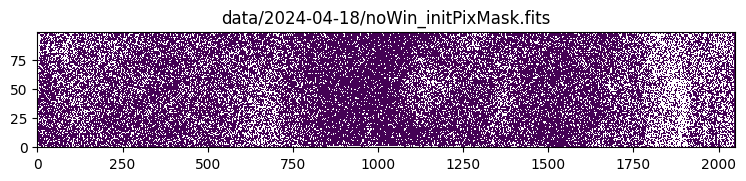

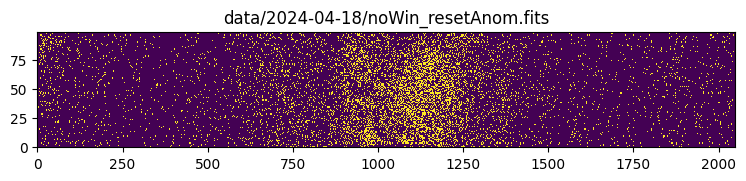

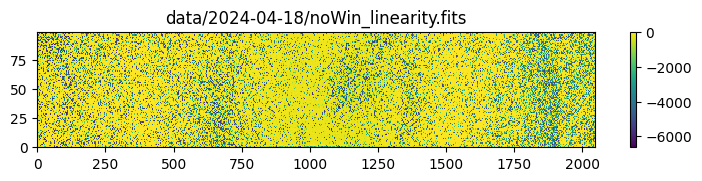

In [7]:
# Reset anomaly and linearity maps
seqs = ['data/2024-04-17/noWin',
        'data/2024-04-18/noWin']

for s in seqs:
    files = glob(s+'*_dark.fits')
    maskSum = None # Preliminary bad pixel mask
    badFreq = 0.5
    medDark = []
    
    for file in tqdm(files):
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)

        dark = Odgw(file, skipReads=1, verbose=False)
        dark.applyRefMap(refMap)
        dark.separateWindow()
        medDark.append(dark.ff.copy())
        
        dark.fitModel(verbose=False)
        dark.calcMask2(verbose=False)

        if maskSum is None:
            maskSum = np.isnan(dark.pixMask).astype(int)
        else:
            maskSum += np.isnan(dark.pixMask)

    # Bad pixel map
    inds = np.where(maskSum > np.max(maskSum)*badFreq)
    ma = np.ones(maskSum.shape)
    ma[inds] = np.nan
    
    # Reset anomaly map
    medDark = np.median(medDark, axis=0)
    anom = findResetAnomaly(medDark*ma)
    
    # Linearity map
    p = calcLinearity(medDark)
    
    writeFits(ma, s+'_initPixMask.fits', overwrite=True)
    writeFits(anom.astype(int), s+'_resetAnom.fits', overwrite=True)
    writeFits(p, s+'_linearity.fits', overwrite=True)
    
    plt.figure(figsize=(9,1.5))
    plt.imshow(ma, origin='lower', interpolation='none', aspect='auto')
    plt.title(s+'_initPixMask.fits')

    # plt.figure()
    # _ = plt.hist(maskSum[maskSum>0], bins=np.arange(np.max(maskSum)+1)+0.5)
    # plt.show()
    
    plt.figure(figsize=(9,1.5))
    plt.imshow(anom, origin='lower', interpolation='none', aspect='auto')
    plt.title(s+'_resetAnom.fits')
    
    ma[anom] = np.nan
    plt.figure(figsize=(9,1.5))
    plt.imshow(p[0], origin='lower', interpolation='none', aspect='auto', vmax=0)
    plt.colorbar()
    plt.title(s+'_linearity.fits')
    plt.show()

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:46<00:00,  2.34s/it]


Writing FITS file data/2024-04-17/noWin_s04_masterDark.fits ...
Writing FITS file data/2024-04-17/noWin_s04_pixMask.fits ...


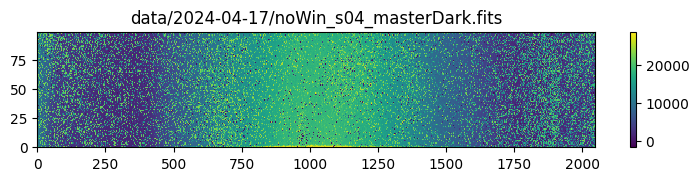

100%|██████████| 20/20 [00:54<00:00,  2.71s/it]


Writing FITS file data/2024-04-18/readHalf_s00_masterDark.fits ...
Writing FITS file data/2024-04-18/readHalf_s00_pixMask.fits ...


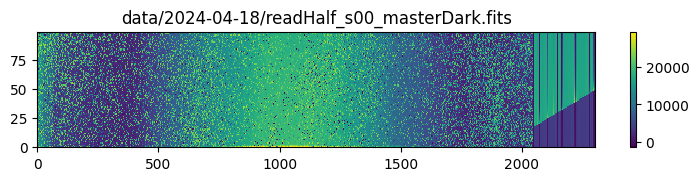

100%|██████████| 20/20 [00:52<00:00,  2.61s/it]


Writing FITS file data/2024-04-18/readHalf_s03_masterDark.fits ...
Writing FITS file data/2024-04-18/readHalf_s03_pixMask.fits ...


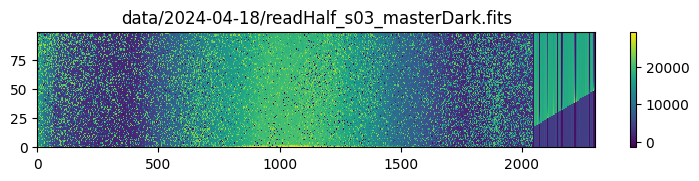

100%|██████████| 20/20 [00:52<00:00,  2.64s/it]


Writing FITS file data/2024-04-18/resetHalf_s00_masterDark.fits ...
Writing FITS file data/2024-04-18/resetHalf_s00_pixMask.fits ...


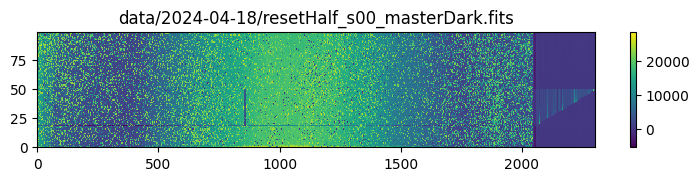

100%|██████████| 20/20 [00:36<00:00,  1.84s/it]


Writing FITS file data/2024-04-18/resetHalf_s03_masterDark.fits ...
Writing FITS file data/2024-04-18/resetHalf_s03_pixMask.fits ...


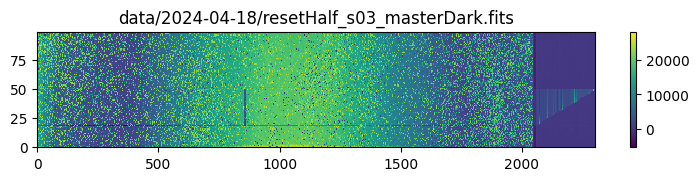

100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Writing FITS file data/2024-04-18/readFull_s00_masterDark.fits ...
Writing FITS file data/2024-04-18/readFull_s00_pixMask.fits ...


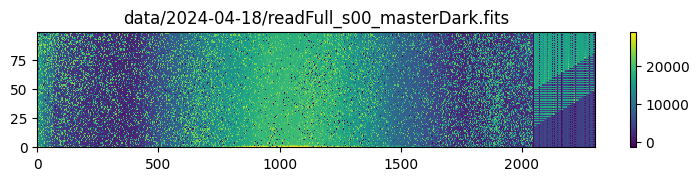

100%|██████████| 19/19 [00:51<00:00,  2.72s/it]


Writing FITS file data/2024-04-18/readFull_s03_masterDark.fits ...
Writing FITS file data/2024-04-18/readFull_s03_pixMask.fits ...


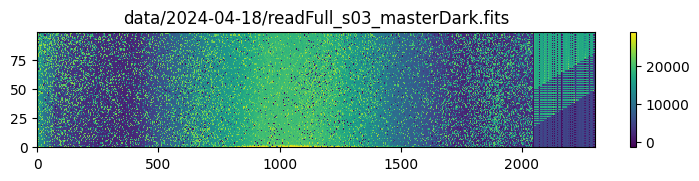

100%|██████████| 19/19 [00:53<00:00,  2.81s/it]


Writing FITS file data/2024-04-18/resetFull_s00_masterDark.fits ...
Writing FITS file data/2024-04-18/resetFull_s00_pixMask.fits ...


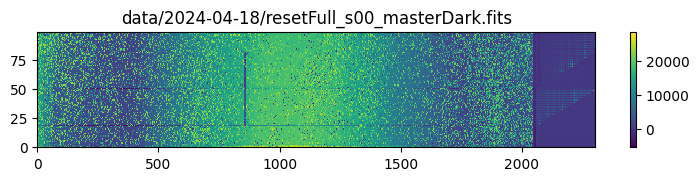

100%|██████████| 20/20 [00:51<00:00,  2.58s/it]


Writing FITS file data/2024-04-18/resetFull_s03_masterDark.fits ...
Writing FITS file data/2024-04-18/resetFull_s03_pixMask.fits ...


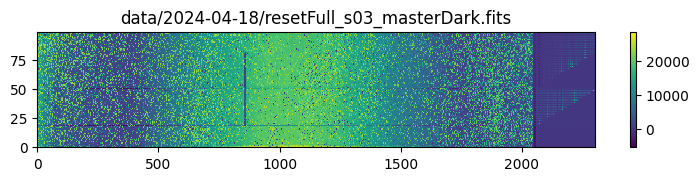

100%|██████████| 20/20 [00:53<00:00,  2.66s/it]


Writing FITS file data/2024-04-18/resetTwo_s00_masterDark.fits ...
Writing FITS file data/2024-04-18/resetTwo_s00_pixMask.fits ...


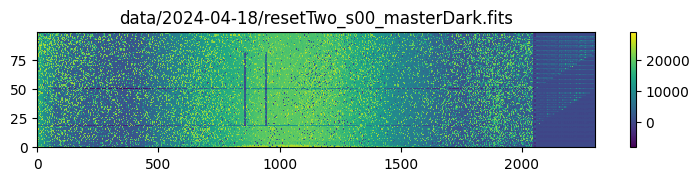

In [4]:
# Darks and bad pixel maps
seqs = ['data/2024-04-17/noWin_s04',
        #  'data/2024-04-17/readHalf_s01',
        #  'data/2024-04-17/readHalf_s04',
        #  'data/2024-04-17/resetHalf_s00',
        #  'data/2024-04-17/resetHalf_s03',
        #  'data/2024-04-17/readFull_s00',
        #  'data/2024-04-17/readFull_s03',
        #  'data/2024-04-17/resetFull_s00',
        #  'data/2024-04-17/resetFull_s03',
        #  'data/2024-04-18/noWin_s00',
        #  'data/2024-04-18/noWin_s04',
         'data/2024-04-18/readHalf_s00',
         'data/2024-04-18/readHalf_s03',
         'data/2024-04-18/resetHalf_s00',
         'data/2024-04-18/resetHalf_s03',
         'data/2024-04-18/readFull_s00',
         'data/2024-04-18/readFull_s03',
         'data/2024-04-18/resetFull_s00',
         'data/2024-04-18/resetFull_s03',
         'data/2024-04-18/resetTwo_s00']

for s in seqs:
    files = glob(s+'*_dark.fits')
    masterDark = []
    maskSum = None
    badFreq = 0.5
    
    for file in tqdm(files):
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)
        
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.applyRefMap(refMap)
        
        # p = fits.getdata(findMatching('linearity', file), memmap=False)
        # dark.linearize(p)
        masterDark.append(dark.data.copy())
        
        dark.separateWindow()
        dark.fitModel(verbose=False)
        dark.calcMask2(verbose=False)

        if maskSum is None:
            maskSum = np.isnan(dark.pixMask).astype(int)
        else:
            maskSum += np.isnan(dark.pixMask)
    
    # Master dark
    masterDark = np.median(masterDark, axis=0)
    
    # Bad pixel map
    inds = np.where(maskSum > np.max(maskSum)*badFreq)
    ma = np.ones(maskSum.shape)
    ma[inds] = np.nan

    writeFits(masterDark, s+'_masterDark.fits', overwrite=True)
    writeFits(ma, s+'_pixMask.fits', overwrite=True)
    
    # anom = fits.getdata(findMatching('resetAnom', files[0]), memmap=False).astype(bool)
    # ma[anom] = np.nan
    
    plt.figure(figsize=(9,1.5))
    plt.imshow(masterDark[-1]-masterDark[0], origin='lower', interpolation='none', aspect='auto')
    plt.colorbar()
    plt.title(s+'_masterDark.fits')
    plt.show()

100%|██████████| 20/20 [00:24<00:00,  1.23s/it]
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


Writing FITS file data/2024-04-17/noWin_s04_masterFlat.fits ...


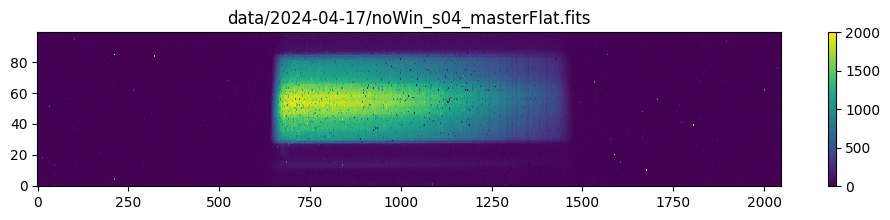

100%|██████████| 20/20 [00:24<00:00,  1.23s/it]


Writing FITS file data/2024-04-18/noWin_s00_masterFlat.fits ...


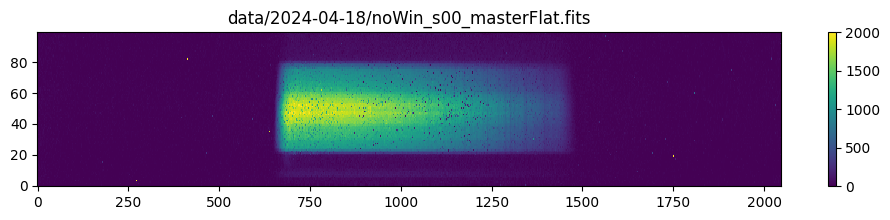

100%|██████████| 20/20 [00:24<00:00,  1.21s/it]


Writing FITS file data/2024-04-18/noWin_s04_masterFlat.fits ...


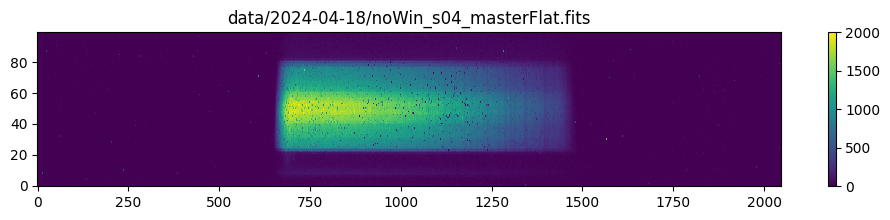

In [5]:
# Spectrum flats
seqs = ['data/2024-04-17/noWin_s05',
        'data/2024-04-18/noWin_s01',
        'data/2024-04-18/noWin_s05']

for s in seqs:
    files = glob(s+'*_flat.fits')
    masterFlat = []
    for f in tqdm(files):
        flat = Odgw(f, skipReads=1, verbose=False)
        flat.separateWindow()
        flat.fitModel(verbose=False)
        refMap = calcRefMap(flat.residual)
        
        flat = Odgw(f, skipReads=1, verbose=False)
        flat.egain = 3.0
        flat.rnoise = 50.0 * 3.0
        flat.applyRefMap(refMap)
        # p = fits.getdata(findMatching('linearity', f), memmap=False)
        # flat.linearize(p)
        dark = fits.getdata(findMatching('dark', f), memmap=False)
        flat.subDark(dark)
        flat.separateWindow()
        flat.fitModel(verbose=False)
        mask = fits.getdata(findMatching('mask', f), memmap=False)
        # anom = fits.getdata(findMatching('resetAnom', f), memmap=False).astype(bool)
        # mask[anom] = np.nan
        
        flat.setPixMask(mask)
        
        masterFlat.append(flat.flux)
    
    s = s[:-1] + str(int(s[-1])-1)
    
    masterFlat = np.nanmedian(masterFlat, axis=0)
    writeFits(masterFlat, s+'_masterFlat.fits', overwrite=True)
    
    _,flat_intp = maskfill(masterFlat, np.isnan(masterFlat))
    
    plt.figure(figsize=(12,2))
    plt.imshow(flat_intp, origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=2000)
    plt.colorbar()
    plt.title(s+'_masterFlat.fits')
    plt.show()

100%|██████████| 20/20 [00:24<00:00,  1.23s/it]
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


Writing FITS file data/2024-04-17/noWin_s04_masterArc.fits ...


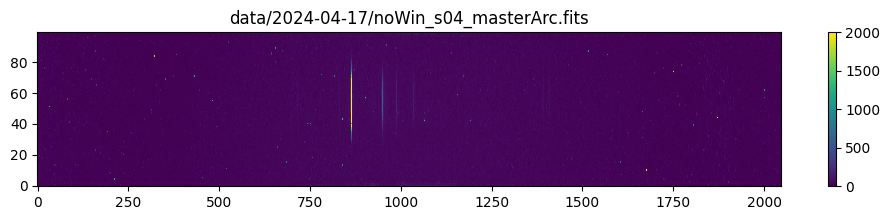

100%|██████████| 20/20 [00:24<00:00,  1.24s/it]


Writing FITS file data/2024-04-18/noWin_s00_masterArc.fits ...


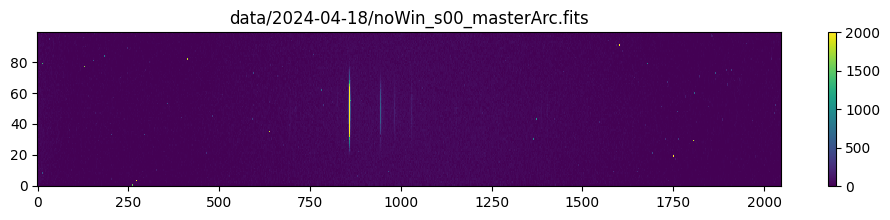

100%|██████████| 20/20 [00:23<00:00,  1.19s/it]


Writing FITS file data/2024-04-18/noWin_s04_masterArc.fits ...


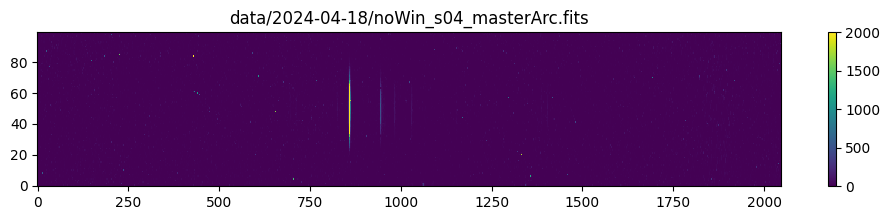

In [6]:
# Arcs
seqs = ['data/2024-04-17/noWin_s07',
        'data/2024-04-18/noWin_s03',
        'data/2024-04-18/noWin_s07']

for s in seqs:
    files = glob(s+'*_arc.fits')
    masterArc = []
    for f in tqdm(files):
        arc = Odgw(f, skipReads=1, verbose=False)
        arc.separateWindow()
        arc.fitModel(verbose=False)
        refMap = calcRefMap(arc.residual)
        
        arc = Odgw(f, skipReads=1, verbose=False)
        arc.egain = 3.0
        arc.rnoise = 50.0 * 3.0
        arc.applyRefMap(refMap)
        # p = fits.getdata(findMatching('linearity', f), memmap=False)
        # arc.linearize(p)
        dark = fits.getdata(findMatching('dark', f), memmap=False)
        arc.subDark(dark)
        arc.separateWindow()
        arc.fitModel(verbose=False)
        mask = fits.getdata(findMatching('mask', f), memmap=False)
        # anom = fits.getdata(findMatching('resetAnom', f), memmap=False).astype(bool)
        # mask[anom] = np.nan
        arc.setPixMask(mask)
        
        masterArc.append(arc.flux)
        
    s = s[:-1] + str(int(s[-1])-3)
        
    masterArc = np.nanmedian(masterArc, axis=0)
    writeFits(masterArc, s+'_masterArc.fits', overwrite=True)
    
    # mask = fits.getdata(findMatching('mask', files[0]), memmap=False)
    # anom = fits.getdata(findMatching('resetAnom', files[0]), memmap=False).astype(bool)
    # mask[anom] = np.nan
    
    _,arc_intp = maskfill(masterArc, np.isnan(masterArc))
    
    plt.figure(figsize=(12,2))
    plt.imshow(arc_intp, origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=2000)
    plt.colorbar()
    plt.title(s+'_masterArc.fits')
    plt.show()

  0%|          | 0/39 [00:00<?, ?it/s]

100%|██████████| 39/39 [09:52<00:00, 15.20s/it]


Writing FITS file data/2024-04-18\resetFull_masterSciRecomb.fits ...
Writing FITS file data/2024-04-18\resetFull_masterErrRecomb.fits ...


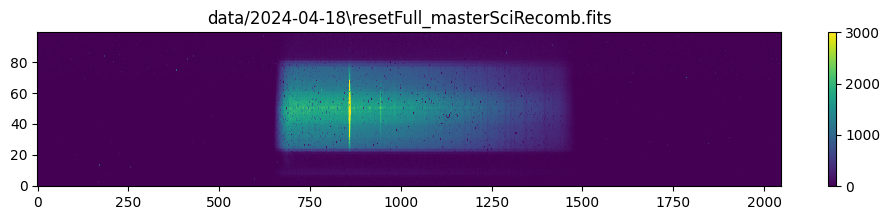

In [5]:
# Science images for illustration
# seqs = [glob('data/2024-04-18/noWin_*_spec.fits'),
#         glob('data/2024-04-18/readHalf_*_spec.fits'),
#         glob('data/2024-04-18/readFull_*_spec.fits'),
seqs = [glob('data/2024-04-18/resetFull_*_spec.fits'),]
        # glob('data/2024-04-18/resetFull_*_spec.fits'),
        # glob('data/2024-04-18/resetTwo_*_spec.fits')]

for seq in seqs:
    masterSci = []
    masterErr = []
    for f in tqdm(seq):
        odgw = Odgw(f, skipReads=1, verbose=False)
        odgw.separateWindow()
        odgw.fitModel(verbose=False)
        refMap = calcRefMap(odgw.residual)
        
        odgw = Odgw(f, skipReads=1, verbose=False)
        odgw.egain = 3.0
        odgw.rnoise = 50.0 * 3.0
        odgw.applyRefMap(refMap)
        dark = fits.getdata(findMatching('dark', f), memmap=False)
        odgw.subDark(dark)
        odgw.separateWindow()
        odgw.fitModel(method='Robberto', verbose=False)
        if odgw.haveWin:
            odgw.fitWinModel(method='Robberto', verbose=False)
        mask = fits.getdata(findMatching('mask', f), memmap=False)
        odgw.setPixMask(mask)
        if odgw.haveWin:
            odgw.recombine()
            
        _,flux_intp = maskfill(odgw.flux, np.isnan(odgw.flux))
        _,err_intp = maskfill(odgw.flux, np.isnan(odgw.flux))
            
        masterSci.append(flux_intp)
        masterErr.append(err_intp)
        
    masterSci = np.nanmedian(masterSci, axis=0)
    masterErr = np.nanmedian(masterErr, axis=0)
    i = seq[0].find('_')
    writeFits(masterSci, seq[0][:i]+'_masterSciRecomb.fits', overwrite=True)
    writeFits(masterErr, seq[0][:i]+'_masterErrRecomb.fits', overwrite=True)
    
    # _,sci_intp = maskfill(masterSci, np.isnan(masterSci))
    
    plt.figure(figsize=(12,2))
    plt.imshow(masterSci, origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=3000)
    plt.colorbar()
    plt.title(seq[0][:i]+'_masterSciRecomb.fits')
    plt.show()

### Set up spectrum extraction

Text(0, 0.5, 'Row')

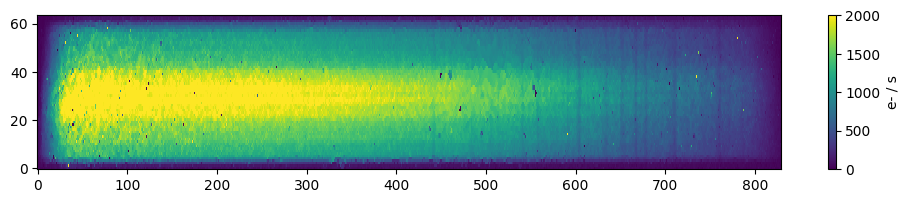

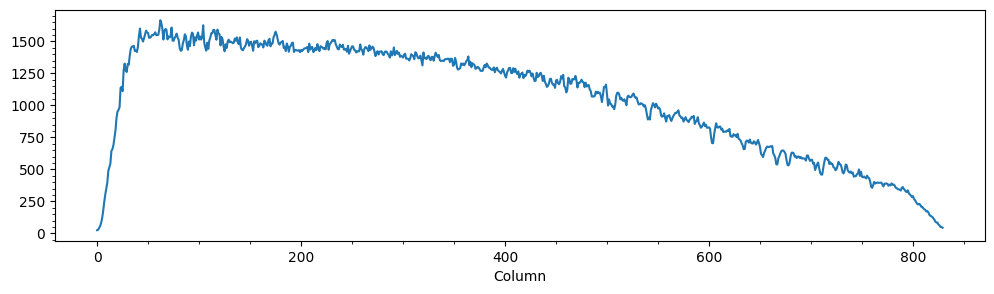

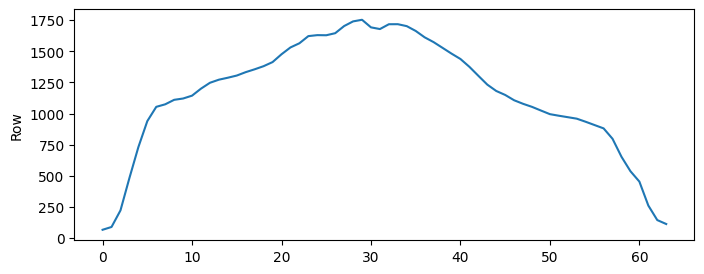

In [92]:
# Find area of image containing spectrum
file = 'data/2024-04-17/noWin_s04_masterFlat.fits'
flat = fits.getdata(file)[25:89, 640:1470]
_,flat = maskfill(flat, np.isnan(flat))

plt.figure(figsize=(12,2))
plt.imshow(flat, origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=2000)
cb = plt.colorbar()
cb.ax.set_ylabel('e- / s')

plt.figure(figsize=(12,3))
plt.plot(np.nanmedian(flat, axis=0))
plt.xlabel('Column')
plt.minorticks_on()

plt.figure(figsize=(8,3))
plt.plot(np.nanmedian(flat, axis=1))
plt.ylabel('Row')

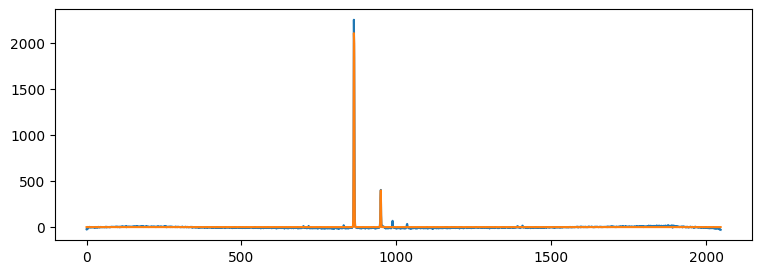

In [102]:
# Tune wavelength solutions
SE = SpecExtractor(fits.getdata('data/2024-04-17/noWin_s04_masterFlat.fits'),
                     fits.getdata('data/2024-04-17/noWin_s04_masterArc.fits'),
                     25, 89, 640, 1470)
plt.figure(figsize=(9,3))
SE.subContinuum(4)
plt.plot(SE.arc)
SE.calcWvs([1108.190, 1110.95], [865,1,2000, 950,1,200])
plt.plot(SE.fitSpec)
# plt.xlim(800,1000)

In [58]:
SE17 = SpecExtractor(fits.getdata('data/2024-04-17/noWin_s04_masterFlat.fits'),
                     fits.getdata('data/2024-04-17/noWin_s04_masterArc.fits'),
                     25, 89, 640, 1470)
SE17.subContinuum(4)
SE17.calcWvs([1108.190, 1110.95], [865,1,2000, 950,1,200])

SE18_1 = SpecExtractor(fits.getdata('data/2024-04-18/noWin_s00_masterFlat.fits'),
                     fits.getdata('data/2024-04-18/noWin_s00_masterArc.fits'),
                     19, 83, 650, 1470)
SE18_1.subContinuum(4)
SE18_1.calcWvs([1108.190, 1110.95], [860,1,2000, 945,1,200])

SE18_2 = SpecExtractor(fits.getdata('data/2024-04-18/noWin_s04_masterFlat.fits'),
                     fits.getdata('data/2024-04-18/noWin_s04_masterArc.fits'),
                     20, 84, 650, 1470)
SE18_2.calcWvs([1108.190, 1110.95], [860,1,2000, 945,1,200])

### Get flux and extract spectrum for each image

In [8]:
files = [f for f in glob('data/2024-04-1?/*_s??_e??_*.fits') if not 'dark' in f and not 'BAD' in f and not 'spec1D' in f]

for f in files:
# for f in ['data\\2024-04-17\\resetHalf_s01_e00_spec.fits']:
    if '17\\noWin_s01' in f or '17\\noWin_s03' in f:
        continue
    
    # Calculate refMap from reference pixels
    odgw = Odgw(f, skipReads=1, verbose=False)
    odgw.separateWindow()
    odgw.fitModel(verbose=False)
    refMap = calcRefMap(odgw.residual)
    
    # Apply refMap
    odgw = Odgw(f, skipReads=1, verbose=False)
    odgw.egain = 3.0
    odgw.rnoise = 50.0 * 3.0
    odgw.applyRefMap(refMap)
    # Linearize
    # p = fits.getdata(findMatching('linearity', f), memmap=False)
    # odgw.linearize(p)
    # Subtract dark
    dark = fits.getdata(findMatching('dark', f))
    odgw.subDark(dark)
    # Fit fluxes
    odgw.separateWindow()
    odgw.fitModel(method='Robberto', verbose=False)
    if odgw.haveWin:
        odgw.fitWinModel(method='Robberto', verbose=False)
    mask = fits.getdata(findMatching('mask', f))
    odgw.setPixMask(mask)
    if odgw.haveWin:
        odgw.recombine()
        
    # _,flux_intp = maskfill(odgw.flux, np.isnan(odgw.flux))
    # _,err_intp = maskfill(odgw.fluxErr, np.isnan(odgw.fluxErr))
    # plt.figure(figsize=(12,2))
    # plt.imshow(flux_intp[:,625:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=3000)
    # cb = plt.colorbar()
    # cb.ax.set_ylabel('e- / s')
    # plt.title(f)
    # plt.show()
    
    
    # Select spectrum extractor based on time of observation
    if '2024-04-17' in f: SE = SE17
    else:
        if int(odgw.hdr['DATE'][11:13]) < 20:
            SE = SE18_1
        else:
            SE = SE18_2
    
    # Extract spectrum and save to FITS
    if 'Half_' in f:
        # Extract top and bottom halves of spectrum separately
        w0 = SE.yWeights.copy()
        ySplit = odgw.YWIN[0] - odgw.YFRM + odgw.YWINSIZE
        SE.yWeights[ySplit:] = np.nan
        wvs, specBot = SE.extract(odgw.flux)
        _,   specBotErr = SE.extractErr(odgw.fluxErr)

        SE.yWeights = w0.copy()
        SE.yWeights[:ySplit] = np.nan
        _,   specTop = SE.extract(odgw.flux)
        _,   specTopErr = SE.extractErr(odgw.fluxErr)
        
        SE.yWeights = w0.copy()
        
        writeFits(np.vstack((wvs,specBot,specBotErr,specTop,specTopErr)), f[:-5]+'_spec1D'+f[-5:], overwrite=True)
    else:
        wvs, spec = SE.extract(odgw.flux)
        _, err = SE.extractErr(odgw.fluxErr)
        writeFits(np.vstack((wvs,spec,err)), f[:-5]+'_spec1D'+f[-5:], overwrite=True)
    
    # plt.figure(figsize=(12,4))
    # plt.plot(wvs, spec, ds='steps-mid')
    # plt.fill_between(wvs, spec-err, spec+err, alpha=0.5, step='mid')
    # plt.xlim(1100,1128)
    # plt.title(f[:-5]+'_spec1D'+f[-5:])
    # plt.show()

c:\myStuff\school\skylines\odgw\analysis\reduce.py:876: RuntimeWarning: invalid value encountered in sqrt
  self.fluxErr = np.sqrt(var_P+var_R)


### Align spectra and coadd

In [59]:
def coadd(files, outfile):
    n = len(files)
    wv = np.arange(1101,1128,0.016) * u.nm
    resampler = LinearInterpolatedResampler()

    flux = np.zeros(len(wv))
    err = np.zeros(len(wv))

    for f in files:
        (w,s,e) = fits.getdata(f)
        inds = np.isnan(e) + np.isnan(s) # specutils can't handle nans .-.
        s[inds] = 0
        e[inds] = 1e30
        spec = Spectrum1D(spectral_axis=w*u.nm, flux=s*u.dimensionless_unscaled, uncertainty=StdDevUncertainty(e))
        
        # Resample onto uniform grid
        newspec = resampler(spec, wv)
        
        # Normalize wrt total flux -- range ~0-1
        # newspec = 700 * newspec / np.nansum(newspec.flux)
        
        # Add to total flux, weighted by uncertainty
        flux += newspec.flux.value / newspec.uncertainty.array**2
        err += 1 / newspec.uncertainty.array**2
        
        # plt.plot(w, spec.flux, ds='steps-mid')
        # plt.fill_between(w, spec.flux-spec.uncertainty.array, spec.flux+spec.uncertainty.array, step='mid', alpha=0.3)
        
        # plt.plot(wv, newspec.flux, ds='steps-mid')
        # e = 1/np.sqrt(newspec.uncertainty.array)
        # plt.fill_between(wv, newspec.flux-e, newspec.flux+e, step='mid', alpha=0.3)
        # plt.xlim(1107.7,1108.7)
        
    flux /= err
    err = 1/np.sqrt(err)
    
    writeFits(np.vstack((wv.value,flux,err)), outfile, overwrite=True)

    # plt.figure(figsize=(9,3))
    # plt.plot(wv, flux, ds='steps-mid')
    # plt.fill_between(wv, flux-err, flux+err, step='mid', alpha=0.3)

In [6]:
coadd(glob('data/2024-04-1?/noWin_*_spec_spec1D.fits'), 'dataproducts/spectra/noWin.fits')
coadd(glob('data/2024-04-1?/readHalf_*_spec_bot_spec1D.fits'), 'dataproducts/spectra/readHalf_bot.fits')
coadd(glob('data/2024-04-1?/readHalf_*_spec_top_spec1D.fits'), 'dataproducts/spectra/readHalf_top.fits')
coadd(glob('data/2024-04-1?/resetHalf_*_spec_bot_spec1D.fits'), 'dataproducts/spectra/resetHalf_bot.fits')
coadd(glob('data/2024-04-1?/resetHalf_*_spec_top_spec1D.fits'), 'dataproducts/spectra/resetHalf_top.fits')
coadd(glob('data/2024-04-1?/readFull_*_spec_spec1D.fits'), 'dataproducts/spectra/readFull.fits')
coadd(glob('data/2024-04-1?/resetFull_*_spec_spec1D.fits'), 'dataproducts/spectra/resetFull.fits')
coadd(glob('data/2024-04-1?/resetTwo_*_spec_spec1D.fits'), 'dataproducts/spectra/resetTwo.fits')

coadd(glob('data/2024-04-1?/noWin_*_arc_spec1D.fits'), 'dataproducts/spectra/noWin_arc.fits')
coadd(glob('data/2024-04-1?/readHalf_*_arc_bot_spec1D.fits'), 'dataproducts/spectra/readHalf_bot_arc.fits')
coadd(glob('data/2024-04-1?/readHalf_*_arc_top_spec1D.fits'), 'dataproducts/spectra/readHalf_top_arc.fits')
coadd(glob('data/2024-04-1?/resetHalf_*_arc_bot_spec1D.fits'), 'dataproducts/spectra/resetHalf_bot_arc.fits')
coadd(glob('data/2024-04-1?/resetHalf_*_arc_top_spec1D.fits'), 'dataproducts/spectra/resetHalf_top_arc.fits')
coadd(glob('data/2024-04-1?/readFull_*_arc_spec1D.fits'), 'dataproducts/spectra/readFull_arc.fits')
coadd(glob('data/2024-04-1?/resetFull_*_arc_spec1D.fits'), 'dataproducts/spectra/resetFull_arc.fits')

coadd(glob('data/2024-04-1?/noWin_*_flat_spec1D.fits'), 'dataproducts/spectra/noWin_flat.fits')

Writing FITS file dataproducts/spectra/noWin.fits ...
Writing FITS file dataproducts/spectra/readHalf_bot.fits ...
Writing FITS file dataproducts/spectra/readHalf_top.fits ...
Writing FITS file dataproducts/spectra/resetHalf_bot.fits ...
Writing FITS file dataproducts/spectra/resetHalf_top.fits ...
Writing FITS file dataproducts/spectra/readFull.fits ...
Writing FITS file dataproducts/spectra/resetFull.fits ...
Writing FITS file dataproducts/spectra/resetTwo.fits ...
Writing FITS file dataproducts/spectra/noWin_arc.fits ...
Writing FITS file dataproducts/spectra/readHalf_bot_arc.fits ...
Writing FITS file dataproducts/spectra/readHalf_top_arc.fits ...
Writing FITS file dataproducts/spectra/resetHalf_bot_arc.fits ...
Writing FITS file dataproducts/spectra/resetHalf_top_arc.fits ...
Writing FITS file dataproducts/spectra/readFull_arc.fits ...
Writing FITS file dataproducts/spectra/resetFull_arc.fits ...
Writing FITS file dataproducts/spectra/noWin_flat.fits ...


In [26]:
files = [f for f in glob('data/2024-04-1?/resetFull_*_spec_spec1D.fits') if not '17\\resetFull_s01' in f]
coadd(files, 'dataproducts/spectra/resetFull_spec_truncated.fits')

Writing FITS file dataproducts/spectra/resetFull_spec_truncated.fits ...


### Compare exposures

(0.6, 3.4)

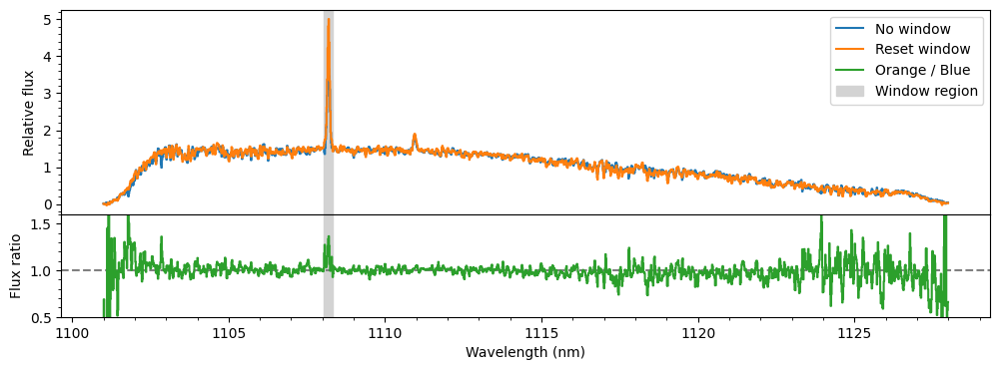

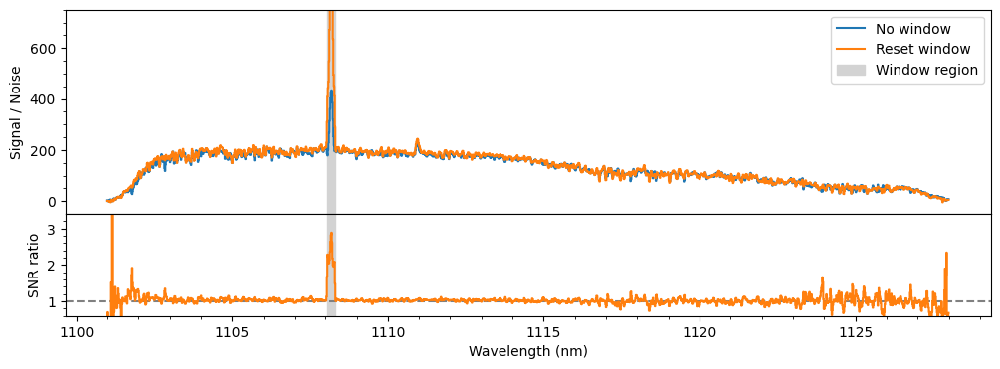

In [6]:
(wv,nowin_flux,nowin_err) = fits.getdata('dataproducts/spectra/noWin.fits', memmap=False)
(wv,reswin_flux,reswin_err) = fits.getdata('dataproducts/spectra/resetFull_truncated.fits', memmap=False)
(wv,readwin_flux,readwin_err) = fits.getdata('dataproducts/spectra/readFull.fits', memmap=False)

nowin_err /= np.mean(nowin_flux)
reswin_err /= np.mean(reswin_flux)
readwin_err /= np.mean(readwin_flux)
nowin_flux /= np.mean(nowin_flux)
reswin_flux /= np.mean(reswin_flux)
readwin_flux /= np.mean(readwin_flux)

fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, nowin_flux, ds='steps-mid', label='No window')
ax0.plot(wv, reswin_flux, ds='steps-mid', label='Reset window')
ax0.plot([1105], [0], label='Orange / Blue')
ax0.axvspan(1108.05,1108.31, color='lightgrey', zorder=0, label='Window region')
ax0.set_ylabel('Relative flux')
ax0.minorticks_on()
ax0.legend()
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, reswin_flux/nowin_flux, ds='steps-mid', c='C2')
ax1.axvspan(1108.05,1108.31, color='lightgrey', zorder=0)
ax1.set_ylabel('Flux ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.5,1.6)
# fig.savefig('thesis/img/flux-nowin-reswin.pdf', dpi=300, bbox_inches='tight')


fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, nowin_flux/nowin_err, ds='steps-mid', label='No window')
ax0.plot(wv, reswin_flux/reswin_err, ds='steps-mid', label='Reset window')
ax0.axvspan(1108.05,1108.31, color='lightgrey', zorder=0, label='Window region')
ax0.set_ylabel('Signal / Noise')
ax0.minorticks_on()
ax0.legend()
ax0.set_ylim(-50,750)
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, (reswin_flux/reswin_err)/(nowin_flux/nowin_err), ds='steps-mid', c='C1')
ax1.axvspan(1108.05,1108.31, color='lightgrey', zorder=0)
ax1.set_ylabel('SNR ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.6,3.4)
# fig.savefig('thesis/img/SNR-nowin-reswin.pdf', dpi=300, bbox_inches='tight')

1.0990352721003533 0.03608432786136896


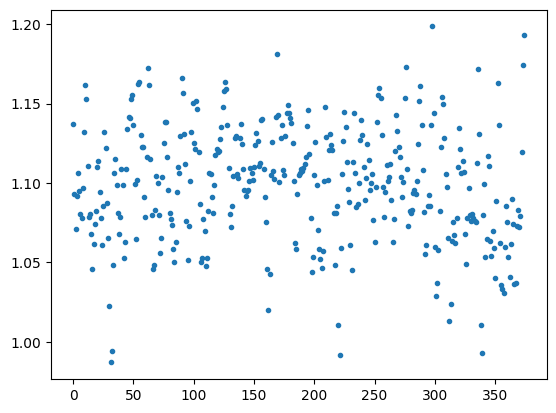

In [100]:
ratio = ((reswin_flux/reswin_err)/(nowin_flux/nowin_err))[500:875]
plt.plot(ratio, '.')
print((np.mean(ratio)),  np.std(ratio))

$\sigma_{b}^2 = \frac{6}{5} \frac{n^2+1}{n(n^2-1)} \frac{b}{t} + 12 \frac{1}{n(n^2-1)} \frac{\sigma_{RN}^2}{t^2}$

_ = 0.12458 b + 604

46400 / sqrt(6825 + 46400 + 600) = 200

In [98]:
np.sqrt(6975 + 46400 + 600) / np.sqrt(6825 + 46400 + 600)

1.0013924351140149

In [92]:
n = 4; t = 2.72912; rn = 150.
sig = lambda b: np.sqrt(6/5 * (n**2 + 1) / (n**3 - n) * b/t + 12 / (n**3 - n) * (rn/t)**2)

print(np.sqrt(6975)/ np.sqrt(6825))

1.0109292863390704


(0.3, 1.3)

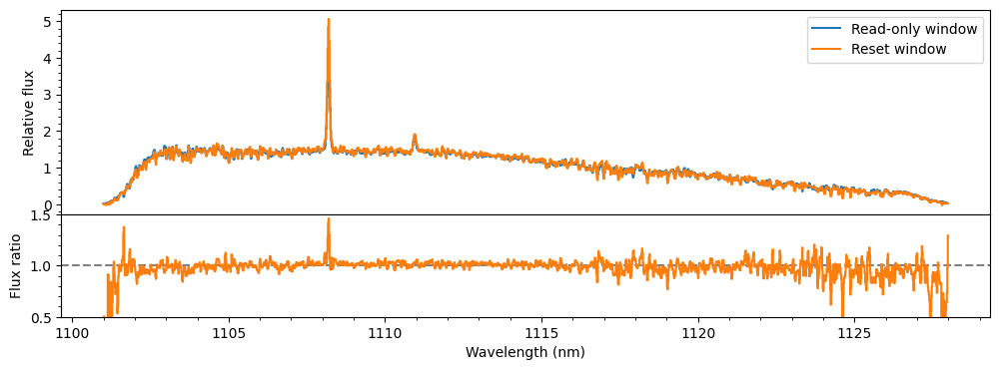

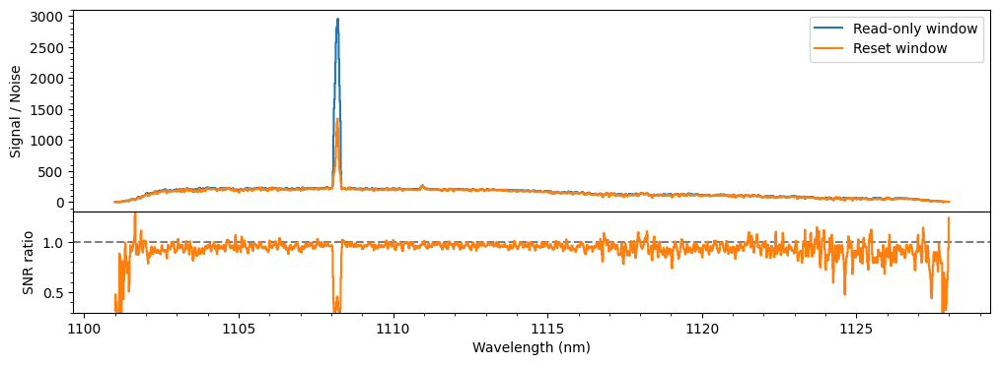

In [44]:
fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, readwin_flux, ds='steps-mid', label='Read-only window')
ax0.plot(wv, reswin_flux, ds='steps-mid', label='Reset window')
ax0.set_ylabel('Relative flux')
ax0.minorticks_on()
ax0.legend()
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, (reswin_flux)/(readwin_flux), ds='steps-mid', c='C1')
ax1.set_ylabel('Flux ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.5,1.5)


fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, readwin_flux/readwin_err, ds='steps-mid', label='Read-only window')
ax0.plot(wv, reswin_flux/reswin_err, ds='steps-mid', label='Reset window')
ax0.set_ylabel('Signal / Noise')
ax0.minorticks_on()
ax0.legend()
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, (reswin_flux/reswin_err)/(readwin_flux/readwin_err), ds='steps-mid', c='C1')
ax1.set_ylabel('SNR ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.3,1.3)

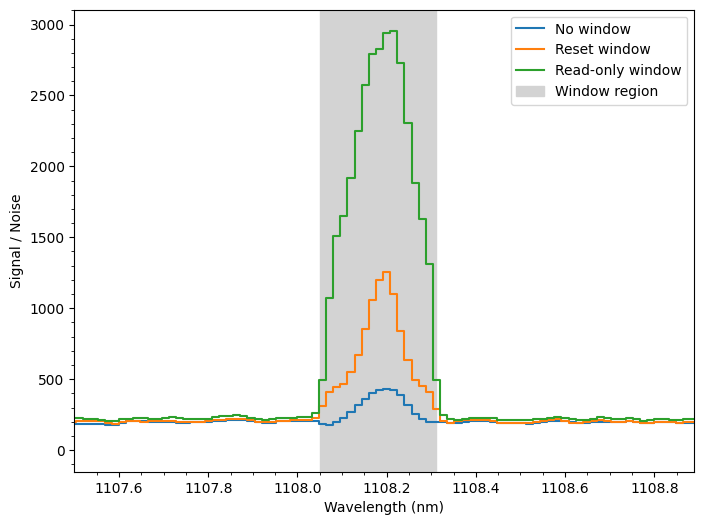

In [75]:
plt.figure(figsize=(8,6))
plt.plot(wv, nowin_flux/nowin_err, ds='steps-mid', label='No window')
plt.plot(wv, reswin_flux/reswin_err, ds='steps-mid', label='Reset window')
plt.plot(wv, readwin_flux/readwin_err, ds='steps-mid', label='Read-only window')
plt.axvspan(1108.05,1108.31, color='lightgrey', zorder=0, label='Window region')

plt.xlim(1107.5,1108.89)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Signal / Noise')
plt.minorticks_on()
plt.legend()
# plt.savefig('thesis/img/SNR-no-read-res.pdf', bbox_inches='tight')

(0.6, 2.6)

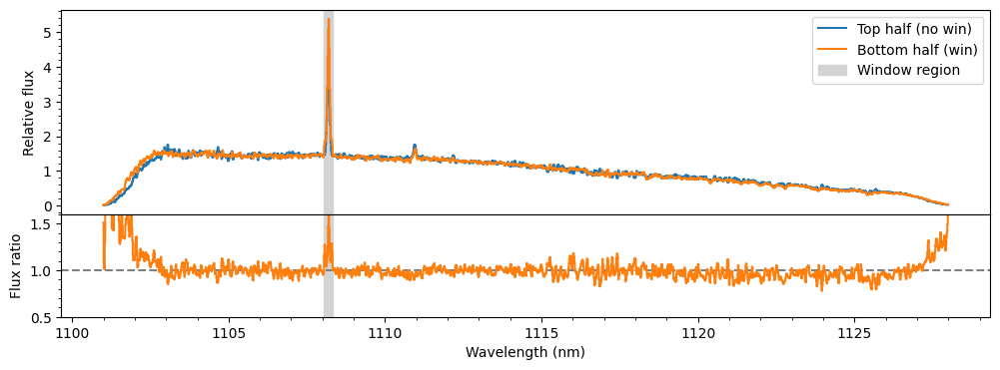

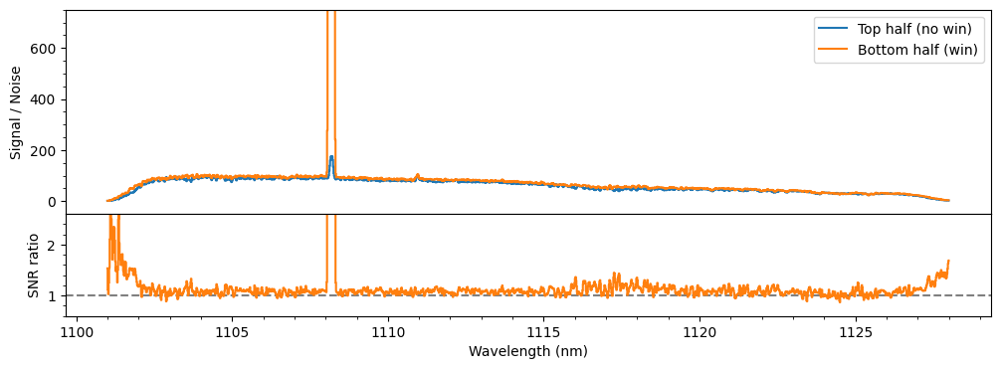

In [72]:
(wv,resTop_flux,resTop_err) = fits.getdata('dataproducts/spectra/resetHalf_top.fits', memmap=False)
(wv,resBot_flux,resBot_err) = fits.getdata('dataproducts/spectra/resetHalf_bot.fits', memmap=False)
(wv,readBot_flux,readBot_err) = fits.getdata('dataproducts/spectra/readhalf_bot.fits', memmap=False)

resTop_err /= np.mean(resTop_flux)
resBot_err /= np.mean(resBot_flux)
readBot_err /= np.mean(readBot_flux)
resTop_flux /= np.mean(resTop_flux)
resBot_flux /= np.mean(resBot_flux)
readBot_flux /= np.mean(readBot_flux)

fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, resTop_flux, ds='steps-mid', label='Top half (no win)')
ax0.plot(wv, resBot_flux, ds='steps-mid', label='Bottom half (win)')
ax0.axvspan(1108.05,1108.31, color='lightgrey', zorder=0, label='Window region')
ax0.set_ylabel('Relative flux')
ax0.minorticks_on()
ax0.legend()
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, resBot_flux/resTop_flux, ds='steps-mid', c='C1')
ax1.axvspan(1108.05,1108.31, color='lightgrey', zorder=0)
ax1.set_ylabel('Flux ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.5,1.6)
# fig.savefig('thesis/img/flux-resTop-resBot.pdf', dpi=300, bbox_inches='tight')


fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, resTop_flux/resTop_err, ds='steps-mid', label='Top half (no win)')
ax0.plot(wv, resBot_flux/resBot_err, ds='steps-mid', label='Bottom half (win)')
ax0.set_ylabel('Signal / Noise')
ax0.minorticks_on()
ax0.legend()
ax0.set_ylim(-50,750)
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, (resBot_flux/resBot_err)/(resTop_flux/resTop_err), ds='steps-mid', c='C1')
ax1.set_ylabel('SNR ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.6,2.6)

(0.0, 2.0)

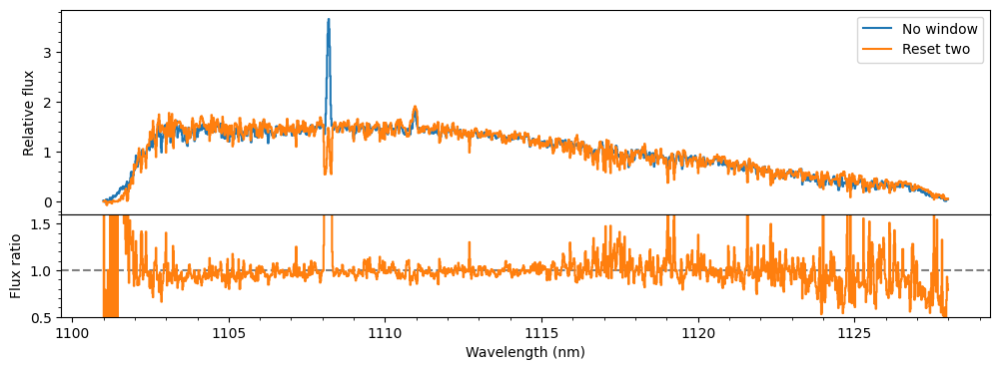

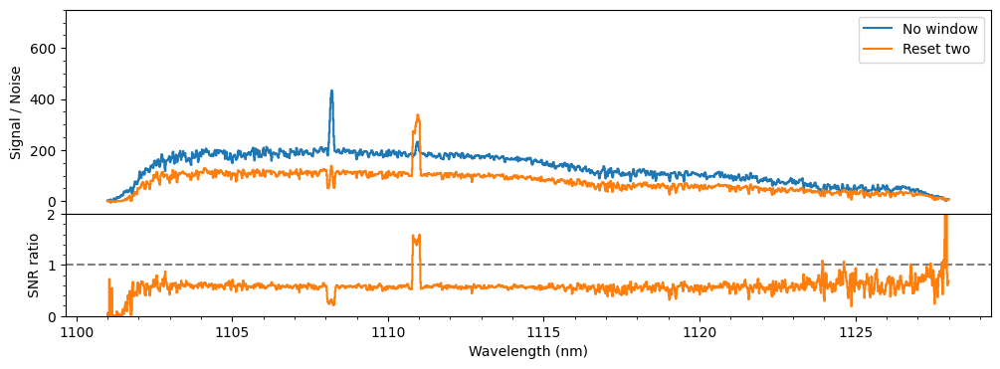

In [11]:
(wv,resTwo_flux,resTwo_err) = fits.getdata('dataproducts/spectra/resetTwo.fits', memmap=False)
(wv,noWin_flux,noWin_err) = fits.getdata('dataproducts/spectra/noWin.fits', memmap=False)

resTwo_err /= np.mean(resTwo_flux)
noWin_err /= np.mean(noWin_flux)
resTwo_flux /= np.mean(resTwo_flux)
noWin_flux /= np.mean(noWin_flux)

fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, noWin_flux, ds='steps-mid', label='No window')
ax0.plot(wv, resTwo_flux, ds='steps-mid', label='Reset two')
ax0.set_ylabel('Relative flux')
ax0.minorticks_on()
ax0.legend()
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, noWin_flux/resTwo_flux, ds='steps-mid', c='C1')
ax1.set_ylabel('Flux ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.5,1.6)
# fig.savefig('thesis/img/flux-resTop-resBot.pdf', dpi=300, bbox_inches='tight')


fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,4), sharex=True, gridspec_kw={'height_ratios':[2,1]})
fig.subplots_adjust(hspace=0)
ax0.plot(wv, noWin_flux/noWin_err, ds='steps-mid', label='No window')
ax0.plot(wv, resTwo_flux/resTwo_err, ds='steps-mid', label='Reset two')
ax0.set_ylabel('Signal / Noise')
ax0.minorticks_on()
ax0.legend()
ax0.set_ylim(-50,750)
# ax0.xlim(1107.7,1108.7)

ax1.axhline(1, ls='--', color='grey')
ax1.plot(wv, (resTwo_flux/resTwo_err)/(noWin_flux/noWin_err), ds='steps-mid', c='C1')
ax1.set_ylabel('SNR ratio')
ax1.set_xlabel('Wavelength (nm)')
ax1.minorticks_on()
ax1.set_ylim(0.,2.)

### restwo fix

In [63]:
files = [f for f in glob('data/2024-04-18/resetTwo_s??_e??_*.fits') if not 'dark' in f and not 'BAD' in f and not 'spec1D' in f]

for f in files:
# for f in ['data\\2024-04-17\\resetHalf_s01_e00_spec.fits']:
    if '17\\noWin_s01' in f or '17\\noWin_s03' in f:
        continue
    
    # Calculate refMap from reference pixels
    odgw = Odgw(f, skipReads=1, verbose=False)
    odgw.separateWindow()
    odgw.fitModel(verbose=False)
    refMap = calcRefMap(odgw.residual)
    
    # Apply refMap
    odgw = Odgw(f, skipReads=1, verbose=False)
    odgw.egain = 3.0
    odgw.rnoise = 50.0 * 3.0
    odgw.applyRefMap(refMap)
    # Linearize
    # p = fits.getdata(findMatching('linearity', f), memmap=False)
    # odgw.linearize(p)
    # Subtract dark
    dark = fits.getdata(findMatching('dark', f))
    odgw.subDark(dark)
    # Fit fluxes
    odgw.separateWindow()
    odgw.fitModel(method='Robberto', verbose=False)
    if odgw.haveWin:
        odgw.fitWinModel(method='Robberto', verbose=False)
    
    # fix the bad reset interval
    for win in range(2):
        wincut = np.delete(odgw.win[win], (24,49,74,99), axis=0)
        rampStarts = [24,36,48,60,72,84]
        
        coeffs = []
        coeffErrs = []
        models = np.zeros((0, odgw.YWINSIZE, odgw.XWINSIZE))
        
        for i,rs in enumerate(rampStarts):
            coeff, coeffErr, model,_,_,_ = calcFluxModel(wincut[rs:rs+12, :, :], order=2, verbose=False)
            coeffs.append(coeff)
            coeffErrs.append(coeffErr)
            models = np.append(models, model, axis=0)
        
        winPer = odgw.NWINS * odgw.WREADINT * odgw.hdr['RTIME'] / 1e6
        
        odgw.winFlux[win] = [odgw.egain * map[1] / winPer for map in coeffs]
        odgw.winFluxErr[win] = [odgw.egain * err[1] / winPer for err in coeffErrs]
        odgw.winModel[win] = models
    
    mask = fits.getdata(findMatching('mask', f))
    odgw.setPixMask(mask)
    if odgw.haveWin:
        odgw.recombine()
        
    # _,flux_intp = maskfill(odgw.flux, np.isnan(odgw.flux))
    # # _,err_intp = maskfill(odgw.fluxErr, np.isnan(odgw.fluxErr))
    # plt.figure(figsize=(12,2))
    # plt.imshow(flux_intp[:,625:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=3000)
    # cb = plt.colorbar()
    # cb.ax.set_ylabel('e- / s')
    # plt.title(f)
    # plt.show()
    
    SE = SE18_2
    
    wvs, spec = SE.extract(odgw.flux)
    _, err = SE.extractErr(odgw.fluxErr)
    writeFits(np.vstack((wvs,spec,err)), f[:-5]+'_spec1D'+f[-5:], overwrite=True)

Writing FITS file data/2024-04-18\resetTwo_s01_e00_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e01_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e02_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e03_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e04_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e05_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e06_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e07_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e08_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e09_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e10_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e11_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e12_arc_spec1D.fits ...
Writing FITS file data/2024-04-18\resetTwo_s01_e13_arc_spec1D.fits ...
Writin

In [65]:
coadd(glob('data/2024-04-1?/resetTwo_*_spec_spec1D.fits'), 'dataproducts/spectra/resetTwo.fits')
coadd(glob('data/2024-04-1?/resetTwo_*_arc_spec1D.fits'), 'dataproducts/spectra/resetTwo_arc.fits')

Writing FITS file dataproducts/spectra/resetTwo.fits ...
Writing FITS file dataproducts/spectra/resetTwo_arc.fits ...


In [54]:
for win in range(2):
    wincut = np.delete(odgw.win[win], (24,49,74,99), axis=0)
    rampStarts = [24,36,48,60,72,84]
    
    coeffs = []
    coeffErrs = []
    models = np.zeros((0, odgw.YWINSIZE, odgw.XWINSIZE))
    
    for i,rs in enumerate(rampStarts):
        coeff, coeffErr, model,_,_,_ = calcFluxModel(wincut[rs:rs+12, :, :], order=2, verbose=False)
        coeffs.append(coeff)
        coeffErrs.append(coeffErr)
        models = np.append(models, model, axis=0)
    
    winPer = odgw.NWINS * odgw.WREADINT * odgw.hdr['RTIME'] / 1e6
    
    odgw.winFlux[win] = [odgw.egain * map[1] / winPer for map in coeffs]
    odgw.winFluxErr[win] = [odgw.egain * err[1] / winPer for err in coeffErrs]
    odgw.winModel[win] = models
    
odgw.recombine()

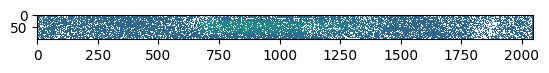

In [56]:
plt.imshow(odgw.flux, interpolation='none')

# Old Method

### Functions

In [49]:
# Functions to load in images

def makeMasterDark(files):
    masterDark = []
    for file in tqdm(files):
        dark = Odgw(file, skipReads=1, verbose=False)
        dark.separateWindow()
        dark.fitModel(verbose=False)
        refMap = calcRefMap(dark.residual)
        
        dark = Odgw(file, skipReads=1, verbose=False)
        if dark.haveWin and not 'RTIME' in dark.hdr:
            dark.hdr['RTIME'] = 25699 # manual override period
            dark.hdr['FTIME'] = 2599584
        dark.applyRefMap(refMap)
        
        masterDark.append(dark.data)
        
    masterDark = np.median(masterDark, axis=0)
    return masterDark
    
def makeMasterScience(files, dark=None, maskFile=None, recombine=True):
    masterSci = []
    masterErr = []
    for file in tqdm(files):
        odgw = Odgw(file, skipReads=1, verbose=False)
        odgw.separateWindow()
        odgw.fitModel(verbose=False)
        refMap = calcRefMap(odgw.residual)

        odgw = Odgw(file, skipReads=1, verbose=False)
        if odgw.haveWin:
            odgw.hdr['ROWPER'] = 25699 # manual override period
            odgw.hdr['FRMPER'] = 2599584
        odgw.applyRefMap(refMap)
        if dark is not None:
            if isinstance(dark, str):
                dark = fits.getdata(dark)
            odgw.subDark(dark)
        odgw.separateWindow()
        odgw.fitModel(verbose=False)
        if odgw.haveWin:
            odgw.fitWinModel(verbose=False)
        if maskFile is not None:
            pixMask = loadFits(maskFile)
            odgw.setPixMask(pixMask)
        
        if odgw.haveWin and recombine:
            odgw.recombine()

        masterSci.append(odgw.flux)
        masterErr.append(odgw.fluxErr)

    masterErr = np.nanstd(masterSci, axis=0)
    masterSci = np.nanmedian(masterSci, axis=0)
    return masterSci, masterErr

def makePretty(image):
    '''function to interpolate over nan pixels'''
    nanmask = np.isnan(image)
    x = np.arange(image.shape[1])
    y = np.arange(image.shape[0])
    xx, yy = np.meshgrid(x,y)
    return griddata((xx[~nanmask],yy[~nanmask]), image[~nanmask], (xx,yy), method='linear')

def basicPlot(image, **kwargs):
    plt.figure(figsize=(12,2))
    plt.imshow(image, origin='lower', interpolation='none', aspect='auto', **kwargs)
    cb = plt.colorbar()
    cb.ax.set_ylabel('Counts / s')

In [3]:
masterDark = []
for i in tqdm(range(1)):
    darkFile = f'data/2024-01-11/spec_s02_e{i:02d}_dark.fits'
    if not os.path.isfile(darkFile):
        continue
    dark = Odgw(darkFile, skipReads=1, verbose=False)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    refMap = calcRefMap(dark.residual)

    dark = Odgw(darkFile, skipReads=1, verbose=False)
    dark.applyRefMap(refMap)
    
    masterDark.append(dark.data)
    
masterDark = np.median(masterDark, axis=0)

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Text(0, 0.5, 'Counts')

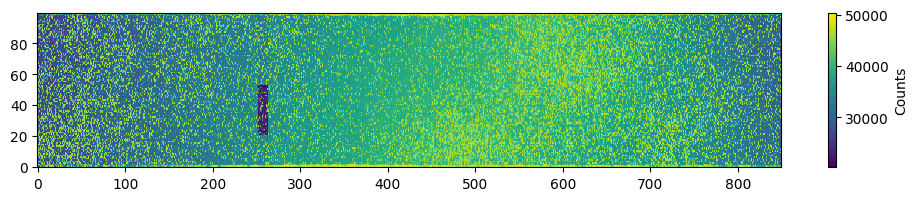

In [4]:
plt.figure(figsize=(12,2))
plt.imshow(masterDark[-1,:,650:1500], origin='lower', interpolation='none', aspect='auto')
cb = plt.colorbar()
cb.ax.set_ylabel('Counts')

In [3]:
masterSpec = []
specErr = []
for i in tqdm(range(1)):
    file = f'data/2024-01-11/spec_s03_e{i:02d}_halfWin.fits'
    if not os.path.isfile(file):
        nSpec -= 1
        continue
    odgw = Odgw(file, skipReads=1, verbose=False)
    odgw.separateWindow()
    odgw.fitModel(verbose=False)
    refMap = calcRefMap(odgw.residual)

    odgw = Odgw(file, skipReads=1, verbose=False)
    odgw.applyRefMap(refMap)
    odgw.subDark(masterDark)
    odgw.separateWindow()
    odgw.fitModel(verbose=False)
    if odgw.haveWin:
        odgw.fitWinModel(verbose=False)
    pixMask = loadFits('data/2024-01-11/spec_s00_pixMask.fits')
    odgw.setPixMask(pixMask)
    
    odgw.recombine()
    
    masterSpec.append(odgw.flux)
    specErr.append(odgw.fluxErr)
    
masterSpec = np.nanmedian(masterSpec, axis=0)
specErr = np.nanmedian(specErr, axis=0)


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

Fitting flux curve to reads 0.0 .. 3.0
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3


C:\myStuff\school\skylines\odgw\analysis\reduce.py:212: RuntimeWarning: invalid value encountered in multiply
  p = np.zeros(order)*np.inf
C:\myStuff\school\skylines\odgw\analysis\reduce.py:213: RuntimeWarning: invalid value encountered in multiply
  cov = np.zeros((order,order))*np.inf
c:\program files\python37\lib\site-packages\numpy\lib\nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting flux curve to reads 0.0 .. 49.0
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting flux curve to reads 0.0 .. 49.0
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting flux curve to reads 0.0 .. 49.0
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3
Fitting polynomials to ramps of order 3


100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [04:07<00:00, 247.21s/it]
c:\program files\python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


### Extract spectrum

Text(0, 0.5, 'S/N')

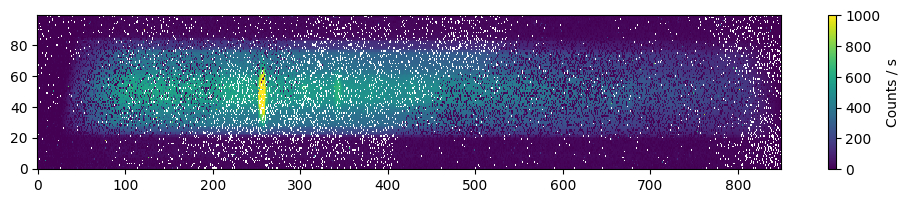

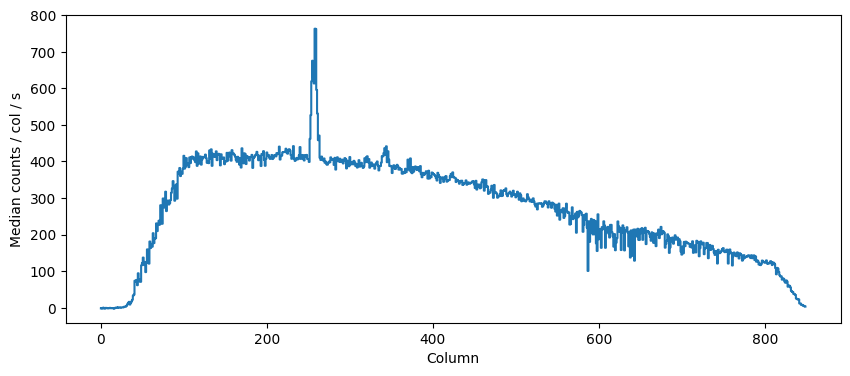

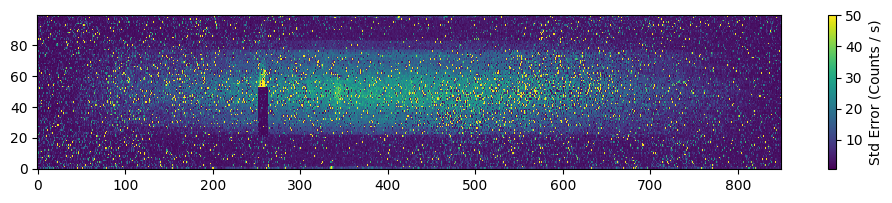

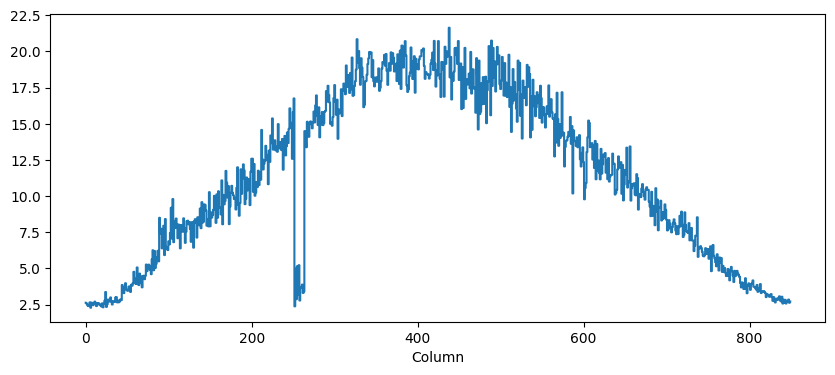

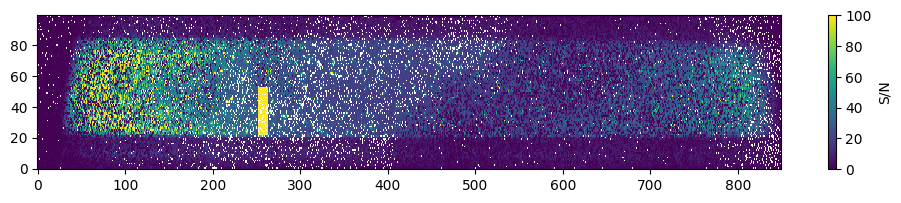

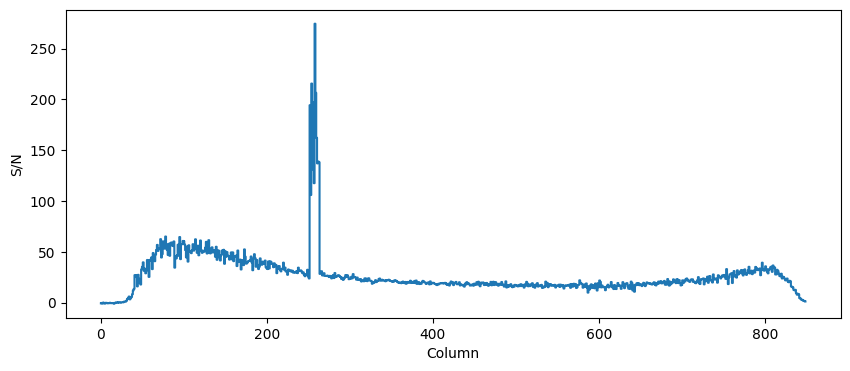

In [9]:
plt.figure(figsize=(12,2))
plt.imshow(masterSpec[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000, cmap='viridis')
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian(masterSpec[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median counts / col / s')


plt.figure(figsize=(12,2))
plt.imshow(specErr[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmax=50)
cb = plt.colorbar()
cb.ax.set_ylabel('Std Error (Counts / s)')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian(specErr[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
# plt.ylabel('Median counts / col / s')


plt.figure(figsize=(12,2))
plt.imshow((masterSpec/specErr)[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=100)
cb = plt.colorbar()
cb.ax.set_ylabel('S/N')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian(masterSpec[20:80,650:1500], axis=0)/np.nanmedian(specErr[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('S/N')

## Show some images

In [52]:
darks = ['data/2024-04-17/noWin_s00_masterDark.fits',
         'data/2024-04-17/readHalf_s01_masterDark.fits',
         'data/2024-04-17/resetHalf_s00_masterDark.fits']
specs = [glob('data/2024-04-17/noWin_s01_*_spec.fits'),
         glob('data/2024-04-17/readHalf_s02_*_spec.fits'),
         glob('data/2024-04-17/resetHalf_s01_*_spec.fits')]
masks = ['data/2024-04-17/noWin_s00_pixMask.fits',
         'data/2024-04-17/readHalf_s01_pixMask.fits',
         'data/2024-04-17/resetHalf_s00_pixMask.fits']
labels = ['Normal', 'Full window', 'Half window']

In [73]:
normal, normalerr = makeMasterScience(specs[0], darks[0], masks[0])
readwin, readwinerr = makeMasterScience(specs[1], darks[1], masks[1], recombine=True)
resetwin, resetwinerr = makeMasterScience(specs[2], darks[2], masks[2], recombine=True)

100%|██████████| 18/18 [00:23<00:00,  1.31s/it]
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
100%|██████████| 20/20 [00:25<00:00,  1.28s/it]


In [77]:
_,normal_intp = maskfill(normal, np.isnan(normal))
_,readwin_intp = maskfill(readwin, np.isnan(readwin))
_,resetwin_intp = maskfill(resetwin, np.isnan(resetwin))

# normal_intp = makePretty(normal)
# readwin_intp = makePretty(readwin)
# resetwin_intp = makePretty(resetwin)

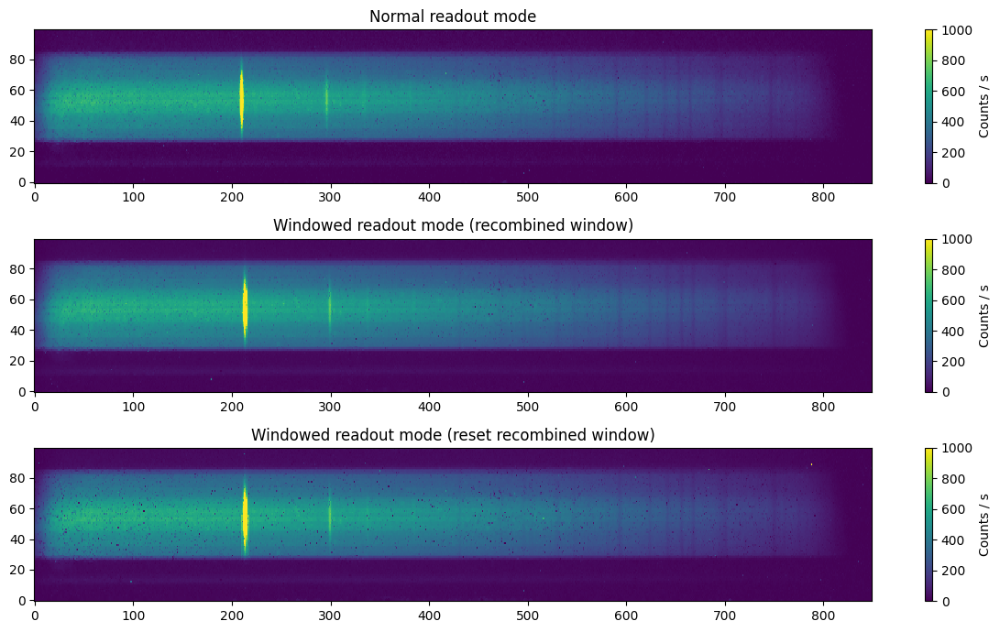

In [78]:
fig, (ax0,ax1,ax2) = plt.subplots(3,1, figsize=(12,7))

im = ax0.imshow(normal_intp[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000)
cb = plt.colorbar(im, ax=ax0)
cb.ax.set_ylabel('Counts / s')
ax0.set_title('Normal readout mode')

im = ax1.imshow(readwin_intp[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000)
cb = plt.colorbar(im, ax=ax1)
cb.ax.set_ylabel('Counts / s')
ax1.set_title('Windowed readout mode (recombined window)')

im = ax2.imshow(resetwin_intp[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000)
cb = plt.colorbar(im, ax=ax2)
cb.ax.set_ylabel('Counts / s')
ax2.set_title('Windowed readout mode (reset recombined window)')

plt.tight_layout()

# fig.savefig('ims/normal-vs-recombwindow.png', dpi=300, transparent=True, bbox_inches='tight')

### others

In [40]:
dark0, _ = makeMasterScience(darks[0], maskFile=masks[0])
dark0_intp = makePretty(dark0)
dark1, _ = makeMasterScience(darks[2], maskFile=masks[2])
dark1_intp = makePretty(dark1)

100%|██████████| 20/20 [00:26<00:00,  1.30s/it]
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
100%|██████████| 19/19 [00:24<00:00,  1.28s/it]


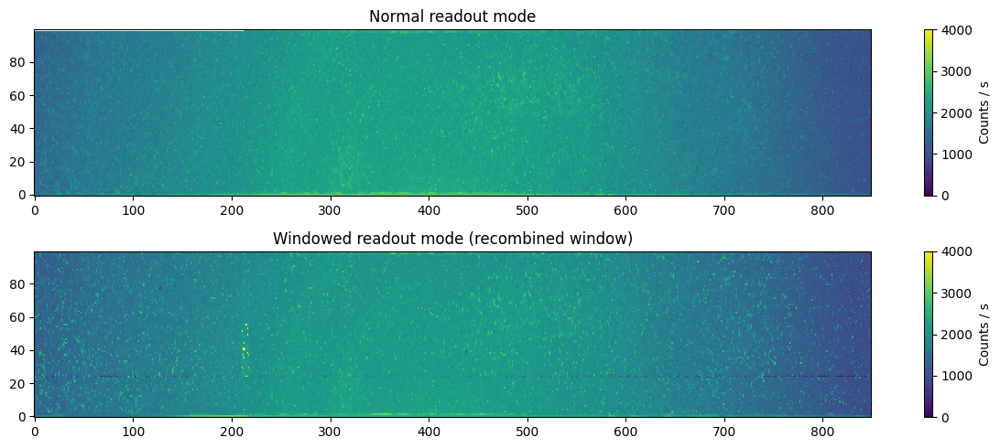

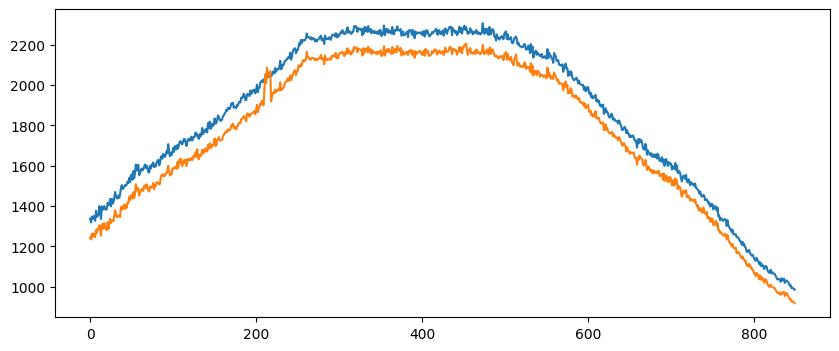

In [54]:
fig, (ax0,ax1) = plt.subplots(2,1, figsize=(12,5))

im = ax0.imshow(dark0_intp[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=4000)
cb = plt.colorbar(im, ax=ax0)
cb.ax.set_ylabel('Counts / s')
ax0.set_title('Normal readout mode')

im = ax1.imshow(dark1_intp[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=4000)
cb = plt.colorbar(im, ax=ax1)
cb.ax.set_ylabel('Counts / s')
ax1.set_title('Windowed readout mode (recombined window)')

plt.tight_layout()

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian(dark0[:,650:1500], axis=0))
plt.plot(np.nanmedian(dark1[:,650:1500], axis=0))

Text(0, 0.5, 'Window - normal counts/s')

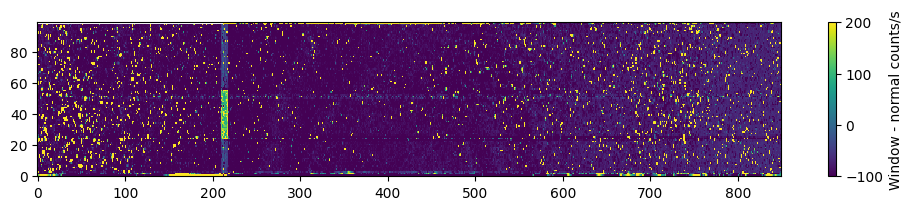

In [42]:
plt.figure(figsize=(12,2))
plt.imshow((dark1_intp-dark0_intp)[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=-100, vmax=200)
cb = plt.colorbar()
cb.ax.set_ylabel('Window - normal counts/s')

## Spectrum extraction setup

In [11]:
tmpDark = makeMasterDark(glob('data/2024-01-11/spec_s00_*_dark.fits')[:1])
mask = 'data/2024-01-11/spec_s00_pixMask2.fits'
tmpSpec, _ = makeMasterScience(glob('data/2024-01-11/spec_s01_*_normal.fits')[:1], tmpDark, mask)

100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


In [12]:
SE = SpecExtractor(0, tmpSpec[20:80])
SE.calcWvs([1108.190, 1110.95], 4, [908,6,1000, 995,6,600, 829,-88,421, 1092,200,480])

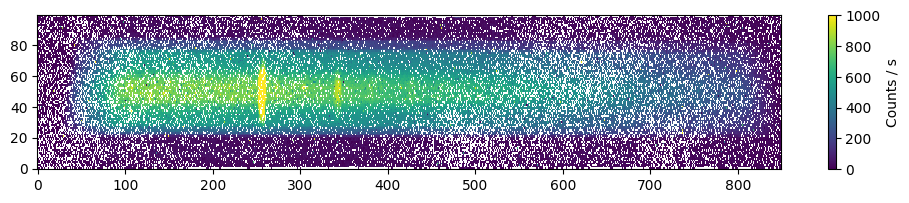

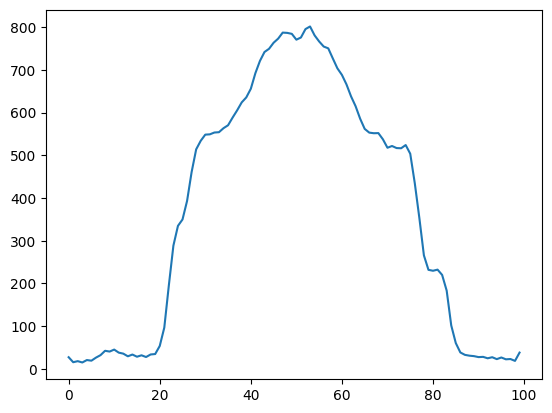

In [13]:
plt.figure(figsize=(12,2))
plt.imshow(tmpSpec[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000)
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure()
plt.plot(np.nanmedian(tmpSpec[:,750:1050], axis=1))

## Spectrum / S/N calculations

### Get and display spectra

In [14]:
# fig, (ax0,ax1) = plt.subplots(2, 1, sharex=True)

ys = []
yerrs = []

for i in range(2):
    masterDark = makeMasterDark(darks[i])
    spec, err = makeMasterScience(specs[i], masterDark, masks[i])
    
    wvs, y = SE.medExtract(spec[20:80])
    _, yerr = SE.medExtract(err[20:80])
    
    ys.append(y)
    yerrs.append(yerr)
    
    # sm = np.convolve(yerr, np.ones(20)/20, mode='same')
    
    # ax0.plot(wvs, y, label=labels[i])
    # ax1.plot(wvs, sm, label=labels[i])
    
# ax0.legend()
# ax1.legend()

100%|██████████| 10/10 [00:13<00:00,  1.33s/it]
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
c:\Program Files\Python37\lib\site-packages\numpy\lib\nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
100%|██████████| 10/10 [00:12<00:00,  1.28s/it]


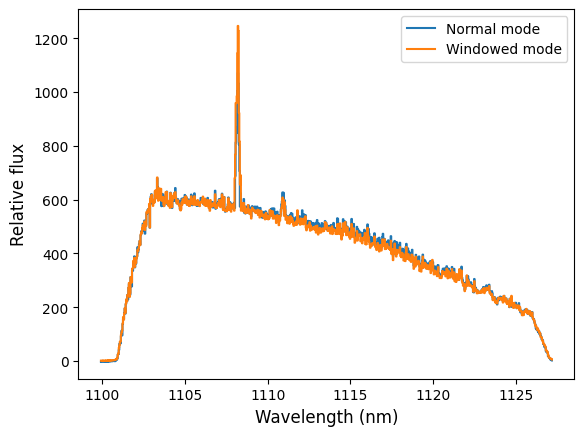

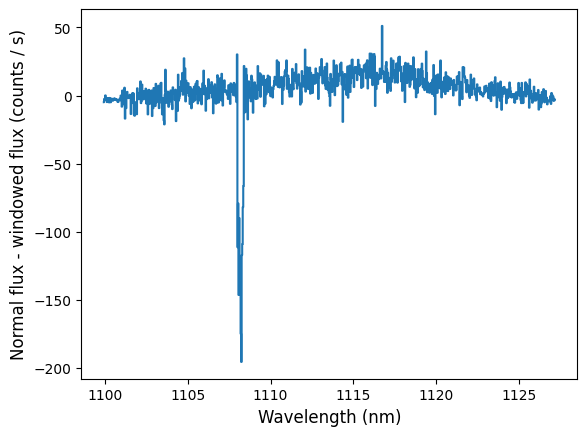

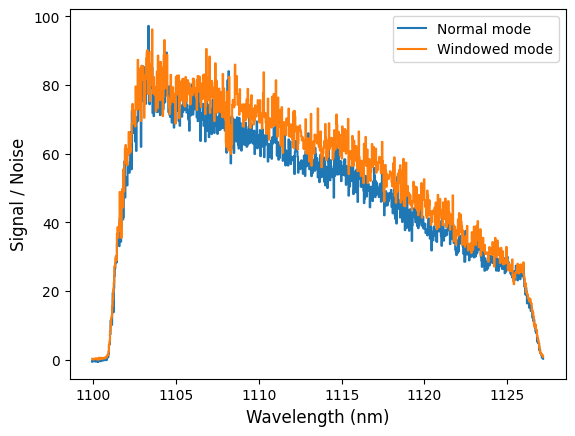

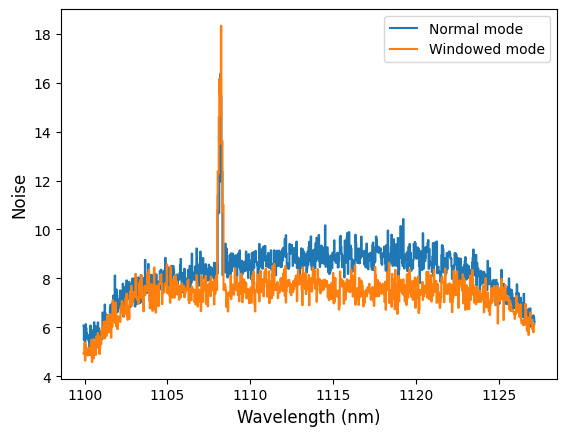

In [15]:
fig1 = plt.figure()
plt.plot(wvs[650:1500], ys[0][650:1500], drawstyle='steps-mid', label='Normal mode')
plt.plot(wvs[650:1500], ys[1][650:1500], drawstyle='steps-mid', label='Windowed mode')

plt.xlabel('Wavelength (nm)', fontsize=12)
plt.ylabel('Relative flux', fontsize=12)
plt.legend()


plt.figure()
plt.plot(wvs[650:1500], (ys[0]-ys[1])[650:1500], drawstyle='steps-mid')
plt.xlabel('Wavelength (nm)', fontsize=12)
plt.ylabel('Normal flux - windowed flux (counts / s)', fontsize=12)


fig2 = plt.figure()
plt.plot(wvs[650:1500], (ys[0]/yerrs[0])[650:1500], drawstyle='steps-mid', label='Normal mode')
plt.plot(wvs[650:1500], (ys[1]/yerrs[1])[650:1500], drawstyle='steps-mid', label='Windowed mode')

plt.xlabel('Wavelength (nm)', fontsize=12)
plt.ylabel('Signal / Noise', fontsize=12)
plt.legend()
# plt.ylim(10, 80)
# plt.grid()


plt.figure()
plt.plot(wvs[650:1500], (yerrs[0])[650:1500], drawstyle='steps-mid', label='Normal mode')
plt.plot(wvs[650:1500], (yerrs[1])[650:1500], drawstyle='steps-mid', label='Windowed mode')

plt.xlabel('Wavelength (nm)', fontsize=12)
plt.ylabel('Noise', fontsize=12)
plt.legend()


# fig1.savefig('ims/spec-flux.png', dpi=300, transparent=False, bbox_inches='tight')
# fig2.savefig('ims/spec-snr.png', dpi=300, transparent=False, bbox_inches='tight')

In [16]:
darks = glob('data/2024-01-11/spec_s00_*_dark.fits')
masterDark = makeMasterDark(darks)
specs = glob('data/2024-01-11/spec_s01_*_normal.fits')
mask = 'data/2024-01-11/spec_s00_pixMask2.fits'
spec, err = makeMasterScience(specs, masterDark, mask)

100%|██████████| 10/10 [00:12<00:00,  1.30s/it]


Text(0, 0.5, 'Median S/N')

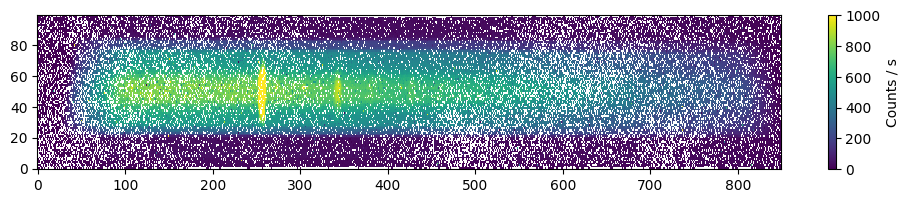

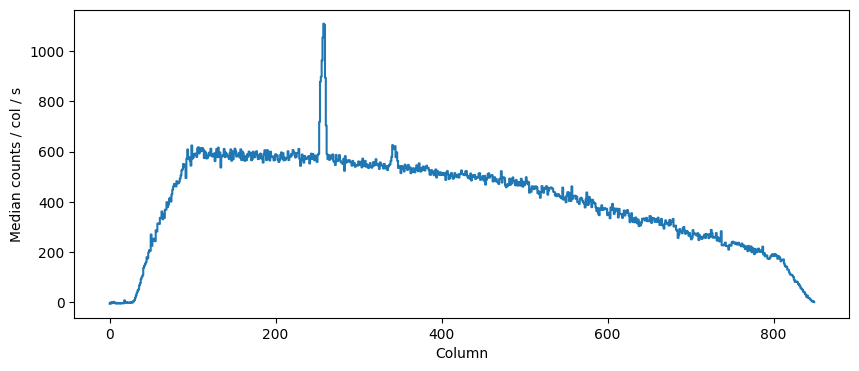

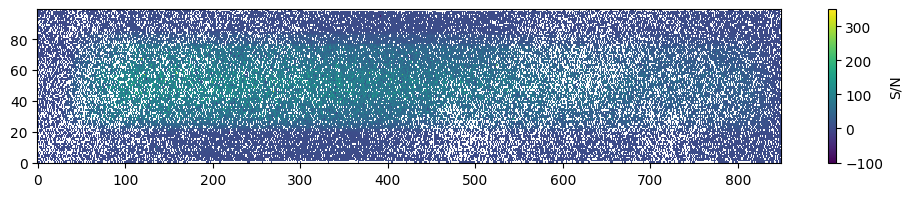

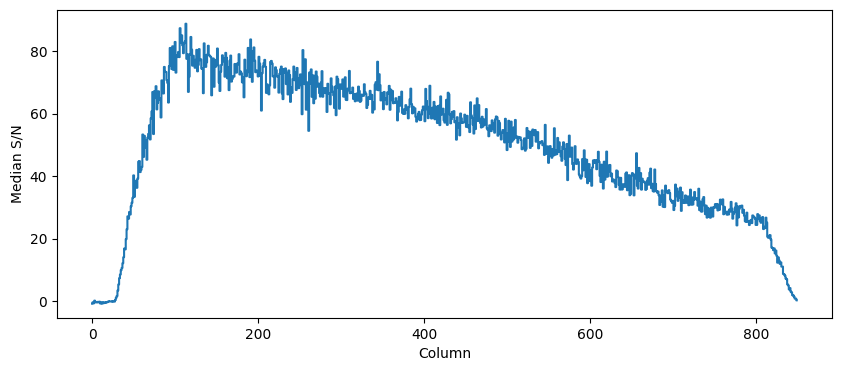

In [17]:
plt.figure(figsize=(12,2))
plt.imshow(spec[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=1000)
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure(figsize=(10,4))
plt.plot(np.nanmean(spec[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median counts / col / s')


plt.figure(figsize=(12,2))
plt.imshow((spec/err)[:,650:1500], origin='lower', interpolation='none', aspect='auto')
cb = plt.colorbar()
cb.ax.set_ylabel('S/N')

plt.figure(figsize=(10,4))
plt.plot(np.nanmean((spec/err)[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median S/N')

### Half-window

In [16]:
darks = glob('data/2024-01-11/spec_s02_*_dark.fits')
# masterDark = makeMasterDark(darks)
# specs = glob('data/2024-01-11/spec_s03_*_halfWin.fits')
mask = 'data/2024-01-11/spec_s00_pixMask.fits'
spec, err = makeMasterScience(darks, maskFile=mask)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:07<00:00,  1.06s/it]


Text(0, 0.5, 'Median S/N / col')

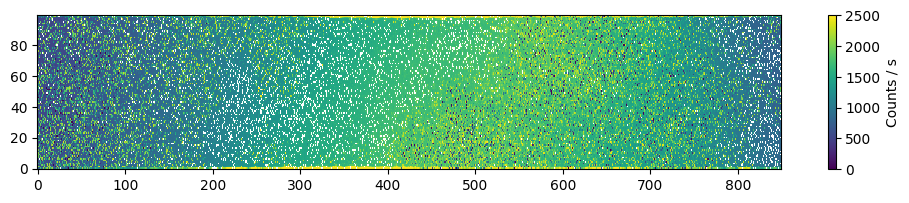

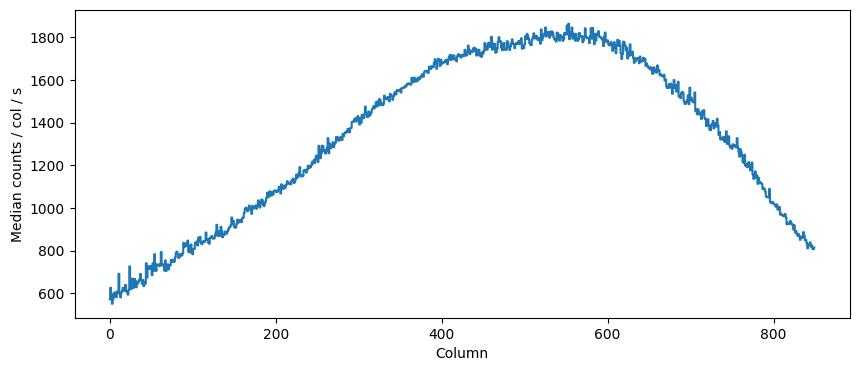

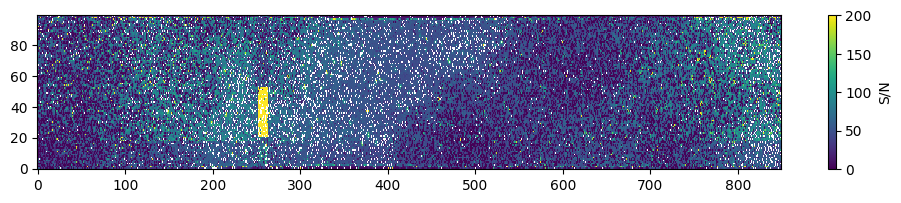

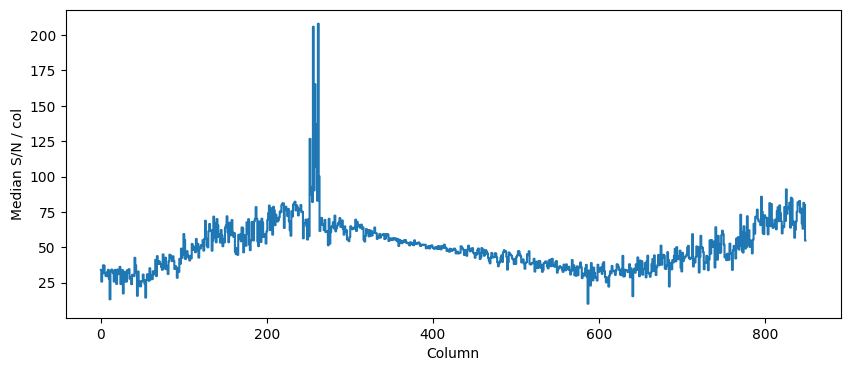

In [26]:
plt.figure(figsize=(12,2))
plt.imshow(spec[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=2500)
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian(spec[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median counts / col / s')


plt.figure(figsize=(12,2))
plt.imshow((spec/err)[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=200)
cb = plt.colorbar()
cb.ax.set_ylabel('S/N')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian((spec/err)[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median S/N / col')

### Check the window flux

In [ ]:
file = 'data/2024-01-11/spec_s04_e00_dark.fits'
file = 'data/2024-01-11/spec_s05_e00_fullWin.fits'
maskFile = 'data/2024-01-11/spec_s00_pixMask.fits'

odgw = Odgw(file, skipReads=1, verbose=False)
odgw.separateWindow()
odgw.fitModel(verbose=False)
refMap = calcRefMap(odgw.residual)

odgw = Odgw(file, skipReads=1, verbose=False)
if odgw.haveWin:
	odgw.hdr['ROWPER'] = 24827 # manual override period
odgw.applyRefMap(refMap)
odgw.separateWindow()
odgw.fitModel(verbose=False)
if odgw.haveWin:
	odgw.fitWinModel(verbose=False)
if maskFile is not None:
	pixMask = loadFits(maskFile)
	odgw.setPixMask(pixMask)
if odgw.haveWin:
	odgw.recombine()

In [159]:
winPer = odgw.NWINS * odgw.WREADINT * odgw.hdr['ROWPER'] / 1e6
framePer = odgw.YFRAMESZ * odgw.hdr['ROWPER'] / 1e6

print(winPer, framePer)

0.049654 2.4827


In [142]:
odgw.hdr['ROWPER']*50/1e6

1.24135

108.296347826087
2271.8954294150303
2271.895429415031


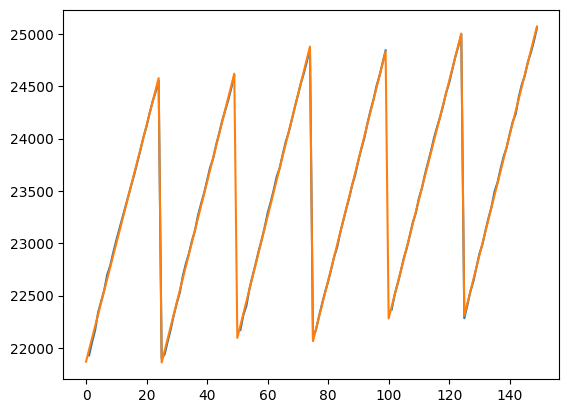

In [157]:
plt.plot(odgw.win[0,50:,1,0])
plt.plot(odgw.winModel[0][:,1,0])

print((odgw.winModel[0][24,1,0] - odgw.winModel[0][0,1,0])/25)
print(odgw.winCoeffMaps[0][0][1][1,0]*25/1.24135)
print(odgw.winFlux[0][0][1,0])

# What's going on with the dark background??

In [177]:
import astropy.time

files = glob('data/2024-02-15/dark_*.fits')

t = []
bkgnds = []

for file in tqdm(files):
    
    dark = Odgw(file, skipReads=1, verbose=False)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    refMap = calcRefMap(dark.residual)
    
    dark = Odgw(file, skipReads=1, verbose=False)
    if dark.haveWin:
        dark.hdr['ROWPER'] = 24827 # manual override period
    dark.applyRefMap(refMap)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    # mask = loadFits(file[:26] + 'pixMask.fits')
    # dark.setPixMask(mask)
    darkFlux = dark.flux
    
    bkgnd = np.nanmedian(darkFlux[:,950:1500])
    
    imTime = astropy.time.Time(dark.DATE).jd - 8/24 #subtract 8hr because dark.DATE is in UTC
    
    t.append(imTime)
    bkgnds.append(bkgnd)

100%|██████████| 128/128 [03:39<00:00,  1.72s/it]


Text(0, 0.5, 'Median Background (Counts/sec)')

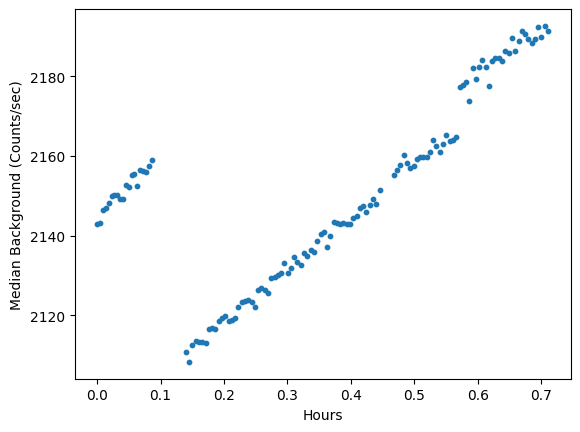

In [178]:
plt.scatter((t-t[0])*24, bkgnds, c='C0', s=10)

# plt.plot([0,0.09], [4520,4550], 'k', lw=0.6)
# plt.plot([0.14,0.45], [5200,5300], 'k', lw=0.6)
# plt.plot([0.47,0.71], [5300,5400], 'k', lw=0.6)

# plt.text(0.05, 4590, 'No window', ha='center', va='center')
# plt.text(0.3, 5200, 'Reading window', ha='center', va='center')
# plt.text(0.6, 5300, 'Resetting window', ha='center', va='center')

# plt.grid()
plt.xlabel('Hours')
plt.ylabel('Median Background (Counts/sec)')

In [183]:
noWin, _ = makeMasterScience(glob('data/2024-02-15/dark_*_noWin.fits'))
bright, _ = makeMasterScience(glob('data/2024-02-15/dark_*_bright.fits'))
brightRes, _ = makeMasterScience(glob('data/2024-02-15/dark_*_brightRes.fits'))

100%|██████████| 20/20 [00:30<00:00,  1.52s/it]


Text(0, 0.5, 'Counts / s')

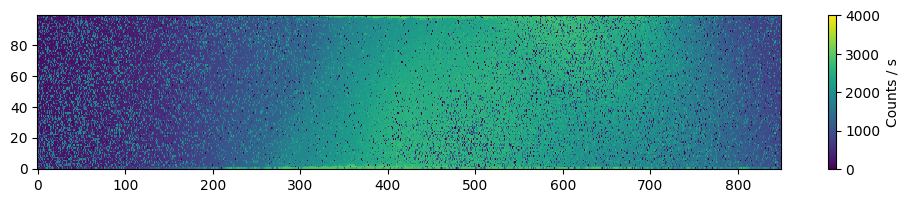

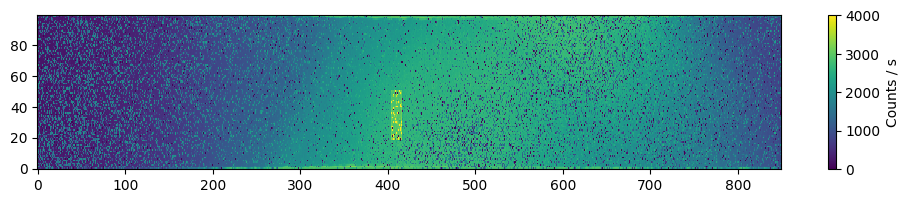

In [186]:
plt.figure(figsize=(12,2))
plt.imshow(bright[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=4000)
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure(figsize=(12,2))
plt.imshow(brightRes[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=4000)
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

#### What do the light spectra look like away from the line?

In [58]:
files = glob('data/2024-01-11/spec_s0[1,3,5]_*.fits')

t = []
bkgnds = []

for file in tqdm(files):
    
    dark = Odgw(file, skipReads=1, verbose=False)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    refMap = calcRefMap(dark.residual)
    
    dark = Odgw(file, skipReads=1, verbose=False)
    dark.applyRefMap(refMap)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    # mask = loadFits(file[:26] + 'pixMask.fits')
    # dark.setPixMask(mask)
    darkFlux = dark.coeffMaps[1]
    
    bkgnd = np.nanmedian(darkFlux[:,950:1500])
    
    imTime = astropy.time.Time(dark.DATE).jd - 8/24 #subtract 8hr because dark.DATE is in UTC
    
    t.append(imTime)
    bkgnds.append(bkgnd)

100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


In [60]:
files = glob('data/2024-01-11/spec_s0[0,2,4]_*dark.fits')

t2 = []
bkgnds2 = []

for file in tqdm(files):
    
    dark = Odgw(file, skipReads=1, verbose=False)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    refMap = calcRefMap(dark.residual)
    
    dark = Odgw(file, skipReads=1, verbose=False)
    dark.applyRefMap(refMap)
    dark.separateWindow()
    dark.fitModel(verbose=False)
    # mask = loadFits(file[:26] + 'pixMask.fits')
    # dark.setPixMask(mask)
    darkFlux2 = dark.coeffMaps[1]
    
    bkgnd = np.nanmedian(darkFlux2[:,950:1500])
    
    imTime = astropy.time.Time(dark.DATE).jd - 8/24 #subtract 8hr because dark.DATE is in UTC
    
    t2.append(imTime)
    bkgnds2.append(bkgnd)

100%|██████████| 27/27 [00:29<00:00,  1.08s/it]


Text(0, 0.5, 'Relative median background')

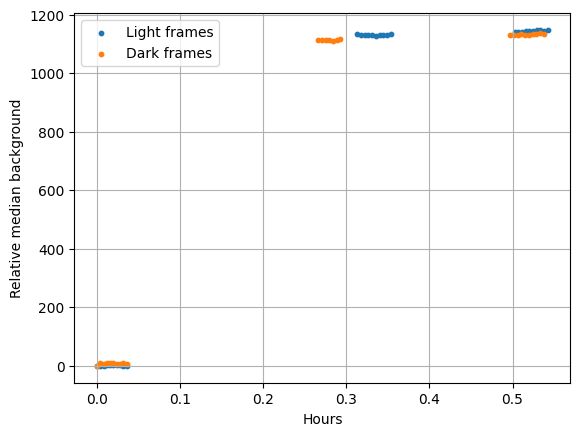

In [55]:
plt.scatter((t-t[0])*24, bkgnds-bkgnds[0], c='C0', s=10, label='Light frames')
plt.scatter((t2-t2[0])*24, bkgnds2-bkgnds2[0], c='C1', s=10, label='Dark frames')
plt.grid()
plt.legend()
plt.xlabel('Hours')
plt.ylabel('Relative median background')

Text(0, 0.5, 'Counts / s')

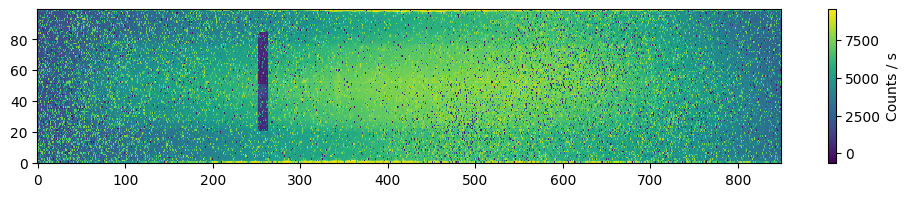

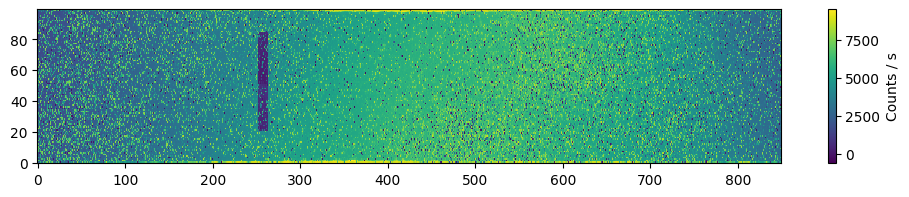

In [61]:
plt.figure(figsize=(12,2))
plt.imshow(darkFlux[:,650:1500], origin='lower', interpolation='none', aspect='auto')
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

plt.figure(figsize=(12,2))
plt.imshow(darkFlux2[:,650:1500], origin='lower', interpolation='none', aspect='auto')
cb = plt.colorbar()
cb.ax.set_ylabel('Counts / s')

In [7]:
file = 'data/2024-01-11/spec_s03_e00_halfWin.fits'

dark = makeMasterDark(glob('data/2024-01-11/spec_s02_e*_dark.fits'))

odgw = Odgw(file, skipReads=1, verbose=False)
odgw.separateWindow()
odgw.fitModel(verbose=False)
refMap = calcRefMap(odgw.residual)

odgw = Odgw(file, skipReads=1, verbose=False)
odgw.applyRefMap(refMap)
if dark is not None:
	odgw.subDark(dark)
odgw.separateWindow()
odgw.fitModel(verbose=False)
if odgw.haveWin:
	odgw.fitWinModel(verbose=False)

pixMask = loadFits('data/2024-01-11/spec_s00_pixMask.fits')
odgw.setPixMask(pixMask)

if odgw.haveWin:
	odgw.recombine()

100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


C:\Users\tgrosson\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
C:\Users\tgrosson\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys


Text(0, 0.5, 'Median S/N / col')

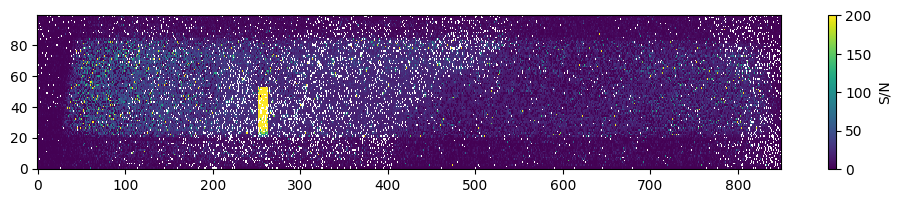

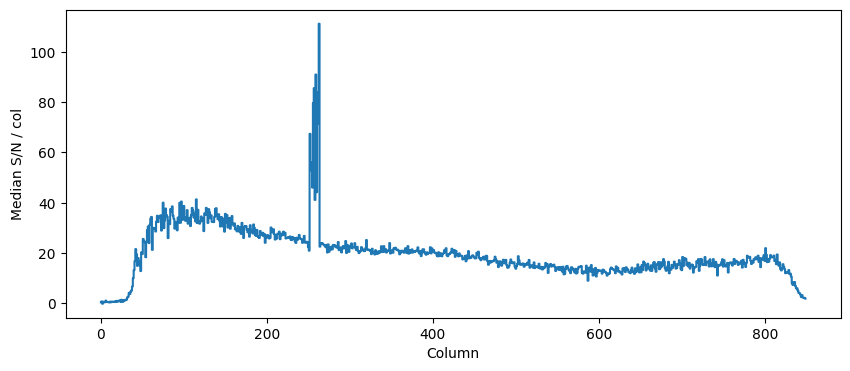

In [8]:
plt.figure(figsize=(12,2))
plt.imshow((odgw.flux/odgw.fluxErr)[:,650:1500], origin='lower', interpolation='none', aspect='auto', vmin=0, vmax=200)
cb = plt.colorbar()
cb.ax.set_ylabel('S/N')

plt.figure(figsize=(10,4))
plt.plot(np.nanmedian((odgw.flux/odgw.fluxErr)[20:80,650:1500], axis=0), drawstyle='steps-mid')
plt.xlabel('Column')
plt.ylabel('Median S/N / col')

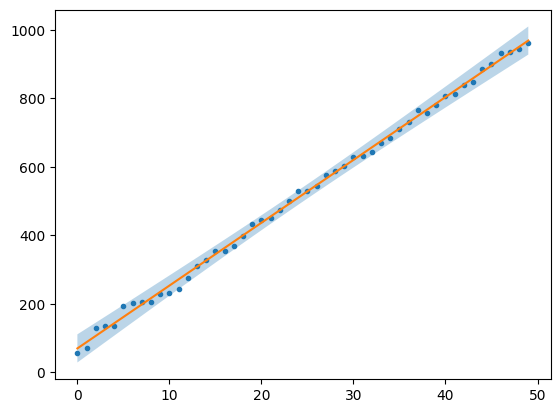

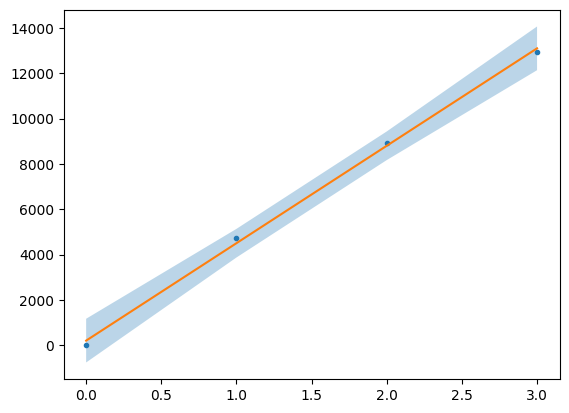

In [9]:
win = odgw.win[0,100:150,7,3].copy()
winMod = odgw.winModel[0][:50,7,3].copy()
co = np.array(odgw.winCoeffMaps[0])
# res = np.array([np.cumsum(co[:,0] + 50*co[:,1], axis=0)[int(i),7,3] for i in np.arange(300)/50])
# res -= res[0]
# win += res
# winMod += res
ff = odgw.ff[:,56,910].copy()
ffMod = odgw.model[:,56,910].copy()

eps = odgw.winResidual[0][:,7,3].copy()
n=50
xi = np.arange(n)
xbar = np.mean(np.arange(n))
intvl = 4.3*np.sqrt(1/(n-2) * np.nansum(eps**2) * (1/n + (xi-xbar)**2/np.sum((xi-xbar)**2)))

plt.figure()
plt.plot(win, '.')
plt.plot(winMod)
plt.fill_between(xi, winMod-intvl, winMod+intvl, alpha=0.3)

eps = odgw.residual[:,56,910].copy()
n = 4
xi = np.arange(n)
xbar = np.mean(np.arange(n))
intvl = 4.3*np.sqrt(1/(n-2) * np.sum(eps**2) * (1/n + (xi-xbar)**2/np.sum((xi-xbar)**2)))

plt.figure()
plt.plot(ff, '.')
plt.plot(ffMod)
plt.fill_between(xi, ffMod-intvl, ffMod+intvl, alpha=0.3)

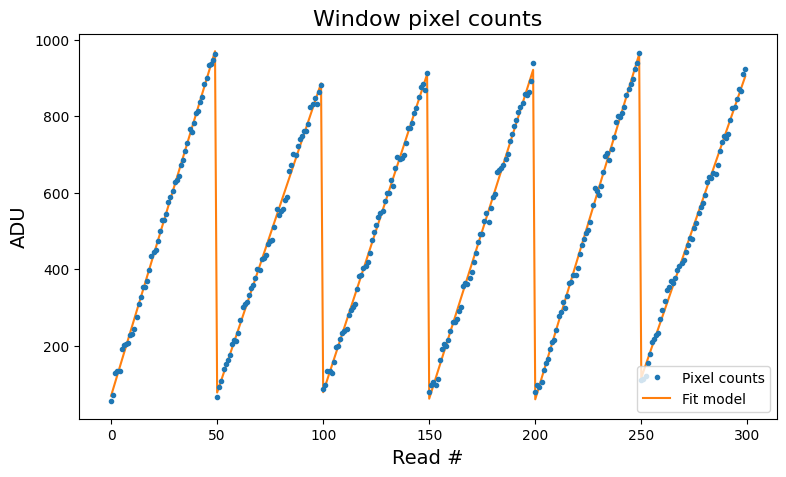

In [25]:
# plt.style.use('tableau-colorblind10')

win = odgw.win[0,100:,7,3].copy()
winMod = odgw.winModel[0][:,7,3].copy()

fig = plt.figure(figsize=(9,5))
plt.plot(win, '.', label='Pixel counts', zorder=2)
plt.plot(winMod, label='Fit model', zorder=1)

plt.xlabel('Read #', fontsize=14)
plt.ylabel('ADU', fontsize=14)
plt.legend(loc='lower right')
plt.title('Window pixel counts', fontsize=16)

# fig.savefig('ims/winramps.png', dpi=300, transparent=False, bbox_inches='tight')

In [7]:
print(odgw.winCoeffMaps[0][0][:,7,3])
print(odgw.winErrMaps[0][0][:,7,3])

[98.08941176 17.35798319]
[4.48874432 0.15786464]


[ 7.74405430e+01  1.99390918e+01 -5.26756857e-02]
[5.20256562 0.4910419  0.00969107]
[ 155.25 4868.75 -208.75]
[123.13889516 197.75        63.16892036]


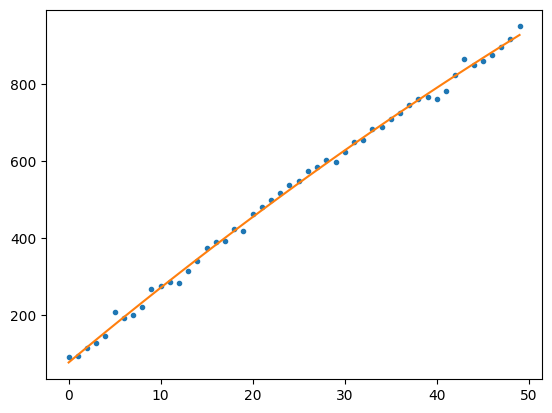

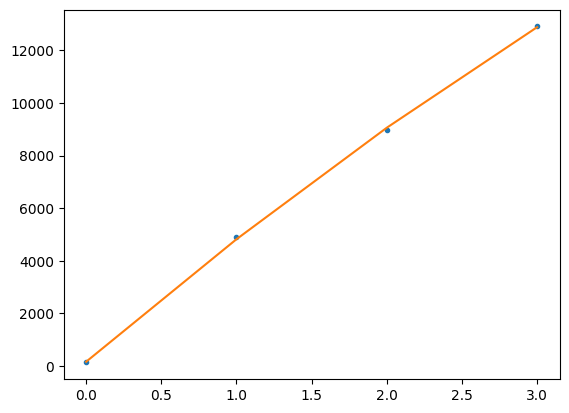

In [18]:
p,cov = np.polyfit(xi, win, deg=2, cov=True)

print(p[::-1])
print(np.sqrt(np.diag(cov))[::-1])

plt.plot(xi, win, '.')
plt.plot(xi, np.polyval(p, xi))

xi = np.arange(4)
p,cov = np.polyfit(xi, ff, deg=2, cov=True)

print(p[::-1])
print(np.sqrt(np.diag(cov))[::-1])

plt.figure()
plt.plot(xi, ff, '.')
plt.plot(xi, np.polyval(p, xi))

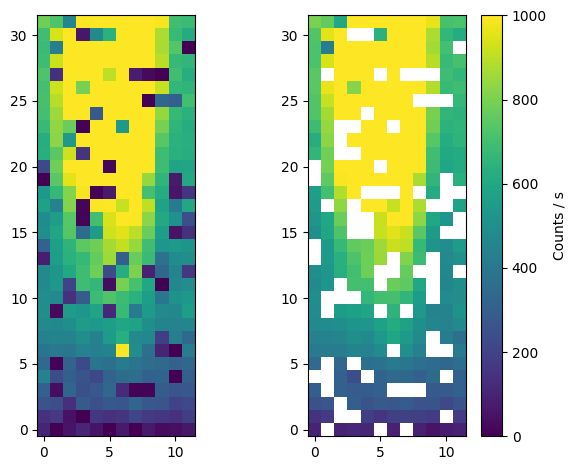

In [34]:
fig, axs = plt.subplots(1, 2)
axs[0].imshow(odgw.winFlux[0][1], origin='lower', interpolation='none', aspect='equal', vmin=0, vmax=1000)
im = axs[1].imshow(masterSpec[odgw.YWIN[0]-odgw.YFRM:odgw.YWIN[0]+odgw.YWINSIZE-odgw.YFRM,
                              odgw.XWIN[0]:odgw.XWIN[0]+odgw.XWINSIZE],
                  origin='lower', interpolation='none', aspect='equal', vmin=0, vmax=1000)
cb = plt.colorbar(im, ax=axs[1])
cb.ax.set_ylabel('Counts / s')
plt.tight_layout()


<IPython.core.display.Javascript object>


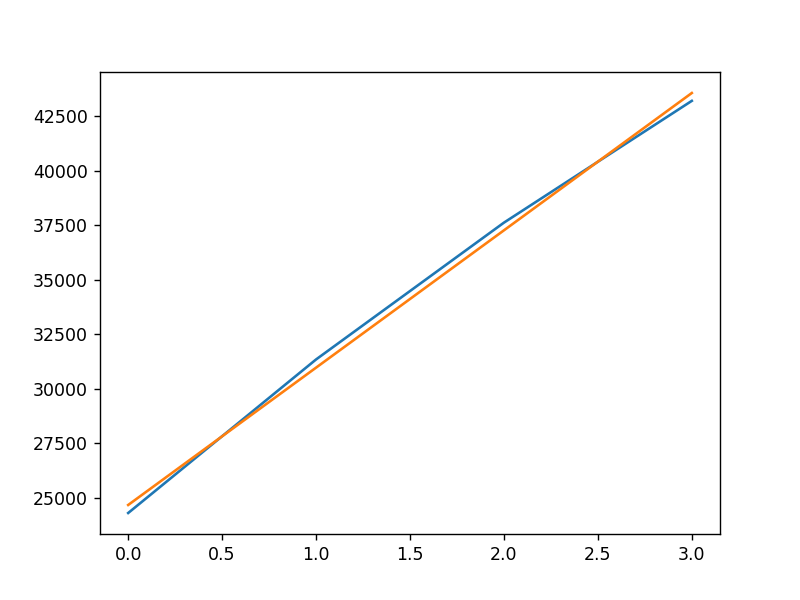

In [32]:
r = 48+1
c = 903+1
plt.figure()
plt.plot(odgw.ff[:,r,c])
plt.plot(odgw.model[:,r,c])

<IPython.core.display.Javascript object>


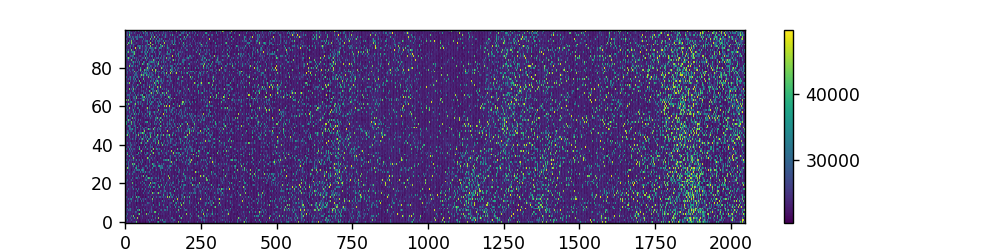

In [30]:
plt.figure(figsize=(8,2))
plt.imshow(odgw.coeffMaps[0], origin='lower', interpolation='none', aspect='auto')
plt.colorbar()

In [48]:
file2 = 'data/2023-12-13/dome_s33_e00_dark.fits'
odgw2 = Odgw(file2, skipReads=1, verbose=False)
odgw2.separateWindow()

Loading data/2023-12-13/dome_s33_e00_dark.fits


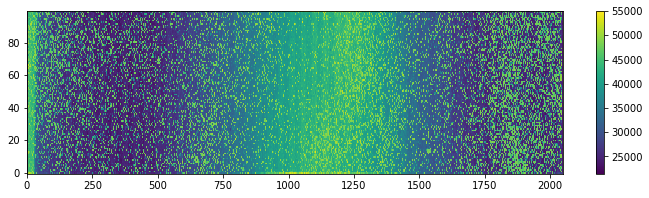

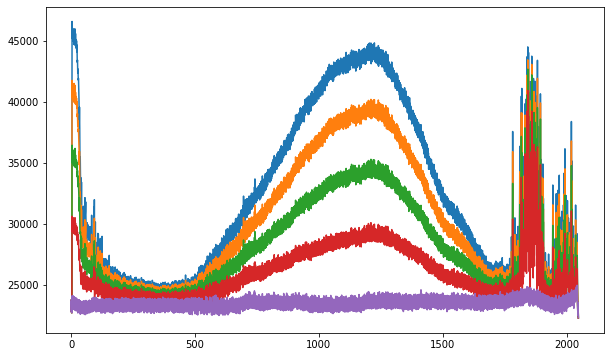

In [55]:
dat = odgw2.ff[4]

plt.figure(figsize=(12,3))
plt.imshow(dat, origin='lower', interpolation='none', aspect='auto')
plt.colorbar()

plt.figure(figsize=(10,6))
plt.plot(np.median(dat, axis=0))
plt.plot(np.median(odgw2.ff[3], axis=0))
plt.plot(np.median(odgw2.ff[2], axis=0))
plt.plot(np.median(odgw2.ff[1], axis=0))
plt.plot(np.median(odgw2.ff[0], axis=0))